In [100]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
import librosa
from utils.utils import save_data
import numpy as np
from scipy.signal import butter, lfilter
from noisereduce import reduce_noise
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from datetime import datetime
import librosa.display
import IPython.display as ipd

In [101]:
label_dir = '../../recordings_with_tones.csv'
audio_dir = '../../recordings'
data_dir = "data" #saving folder

In [102]:
selected_word_columns_with_embedding = {
    'a0p': 0,   
    'a1p': 1,  
    'a2p': 2,
    'a3p': 3,
    'a4p': 4,
    'a5p': 5,
    'a6p': 6,
    'a7p': 7,
    'a8p': 8,
    'a9p': 9,
    'a10p': 10,
    'a100p': 11
}

### Załadowanie Danych

In [103]:
label_data = pd.read_csv(label_dir)

In [104]:
data_rows = []

In [105]:
for index, row in label_data.iterrows():
    file_id = row['id']
    for key,val in selected_word_columns_with_embedding.items():
        if pd.notnull(row[key]):
            file_path = f'{audio_dir}/stageI/{file_id}/{key[:2]}.wav'
            if os.path.exists(file_path):
                data_rows.append({
                    'path': file_path,
                    'embedding': val,
                    'label': int(row[key])
                })
df = pd.DataFrame(data_rows)

In [106]:
df.head()

,path,embedding,label
0,../../recordings/stageI/8/a0.wav,0,0
1,../../recordings/stageI/8/a1.wav,1,1
2,../../recordings/stageI/8/a2.wav,2,1
3,../../recordings/stageI/8/a3.wav,3,1
4,../../recordings/stageI/8/a4.wav,4,0


In [107]:
df['audio'] = df['path'].apply(lambda x: librosa.load(x, sr=None))

In [108]:
df.head()

,path,embedding,label,audio
0,../../recordings/stageI/8/a0.wav,0,0,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,../../recordings/stageI/8/a1.wav,1,1,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,../../recordings/stageI/8/a2.wav,2,1,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,../../recordings/stageI/8/a3.wav,3,1,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,../../recordings/stageI/8/a4.wav,4,0,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [109]:
print("\nLiczba nagrań:", len(df))


Liczba nagrań: 5985


### Zdefiniowanie spektrogramów

In [110]:

def generate_mel_spectrogram(audio, sr, n_mels=128):
    S = librosa.feature.melspectrogram(y=audio, sr=sr, n_mels=128, fmax=8000)
    S_dB = librosa.power_to_db(S, ref=np.max)
    return S_dB

In [111]:
def display_mel_spectrogram_for_audio(audio, sr):
    S_dB = generate_mel_spectrogram(audio,sr)
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', fmax=8000)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"Mel Spectrogram")
    plt.tight_layout()
    plt.show()

In [112]:
def display_mel_spectrogram(df: pd.DataFrame):
    for i, row in df.iterrows():
        audio, sr = row['audio']
        S_dB = row['mel_spectrogram']
        plt.figure(figsize=(10, 4))
        librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', fmax=8000)
        plt.colorbar(format='%+2.0f dB')
        plt.title(f"Mel Spectrogram for {row['path']} with label {row['label']}")
        plt.tight_layout()
        plt.show()

In [113]:
def display_listenable_audio(df: pd.DataFrame, additional_audio_cols=[]):
    for i, row in df.iterrows():
        audio, sr = row['audio']
        print(f"Playing {row['path']} with label {row['label']}")
        ipd.display(ipd.Audio(data=audio, rate=sr))
        display_mel_spectrogram_for_audio(audio,sr)
        for col in additional_audio_cols:
            audiox, srx = row[col]
            print(col)
            ipd.display(ipd.Audio(data=audiox, rate=srx))
            display_mel_spectrogram_for_audio(audiox, srx)

In [114]:
#df['mel_spectrogram'] = df['audio'].apply(lambda x: generate_mel_spectrogram(x[0], x[1]))

Playing ../../recordings/stageI/8/a0.wav with label 0


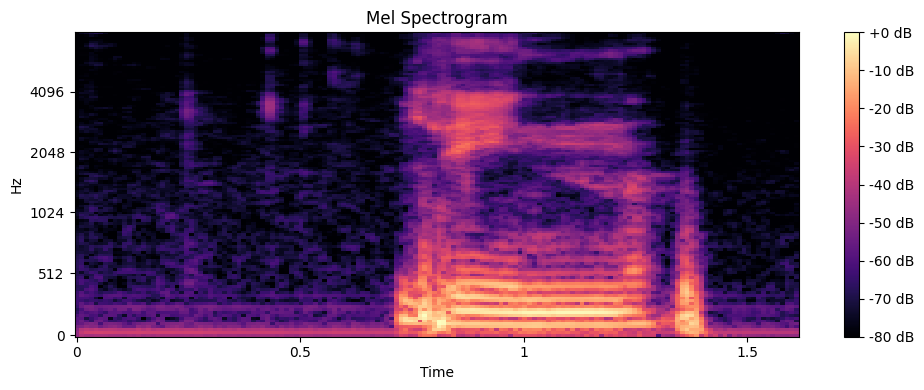

In [115]:
display_listenable_audio(df.head(1))

### Analiza pojedyńczego słowa (selected_embedding)

Poprawne nagrania dla embedding==0
Playing ../../recordings/stageI/9/a0.wav with label 1


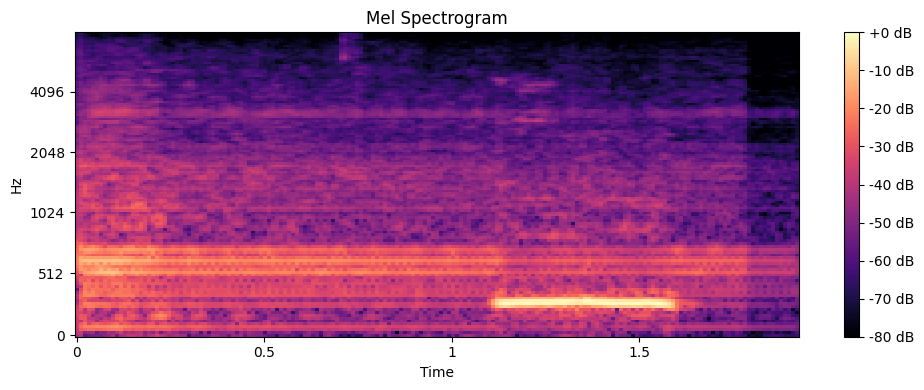

Playing ../../recordings/stageI/380/a0.wav with label 1


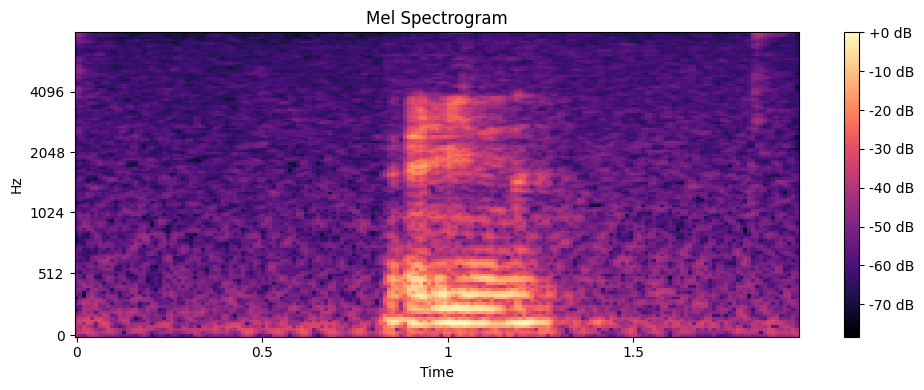

Playing ../../recordings/stageI/693/a0.wav with label 1


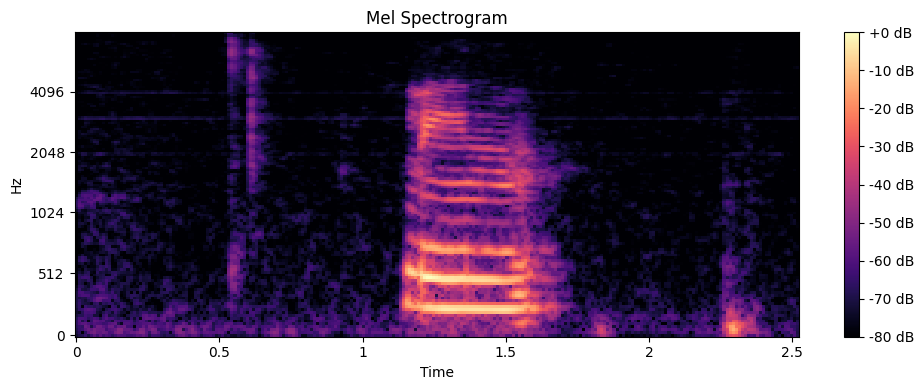

Niepoprawne nagrania dla embedding==0
Playing ../../recordings/stageI/165/a0.wav with label 0


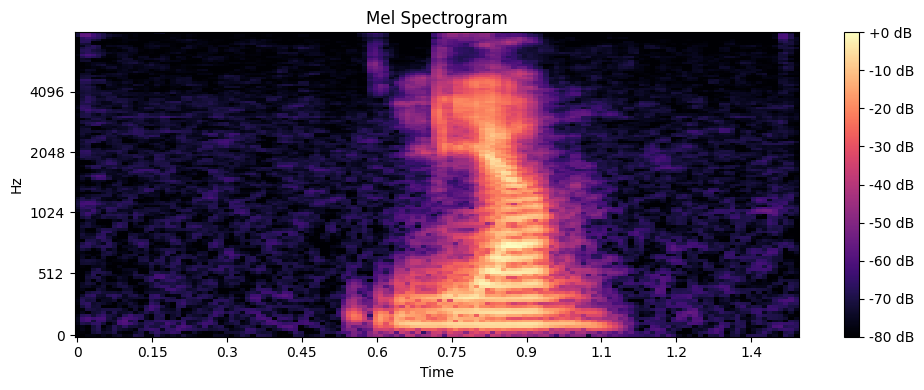

Playing ../../recordings/stageI/523/a0.wav with label 0


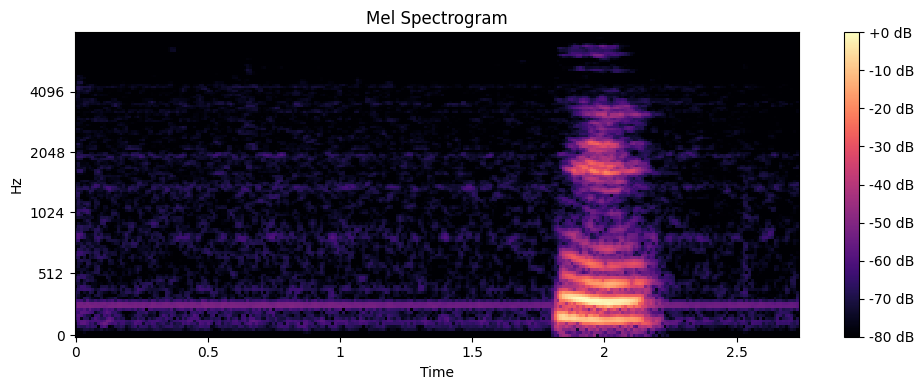

Playing ../../recordings/stageI/1366/a0.wav with label 0


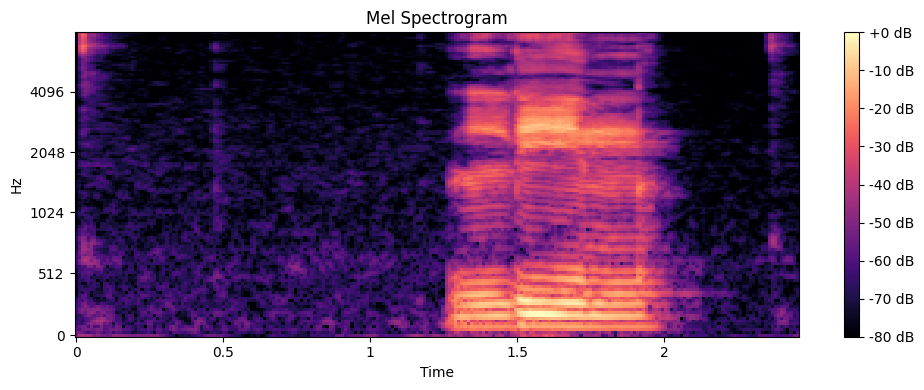

In [116]:
selected_embedding = 0

filtered_df = df[df['embedding'] == selected_embedding]
label_1_df = filtered_df[filtered_df['label'] == 1]
label_0_df = filtered_df[filtered_df['label'] == 0]
print(f"Poprawne nagrania dla embedding=={selected_embedding}")
display_listenable_audio(label_1_df.sample(n=3, random_state=None))
print(f"Niepoprawne nagrania dla embedding=={selected_embedding}")
display_listenable_audio(label_0_df.sample(n=3, random_state=None))


### Usunięcie nagrań z dużym szumem

In [117]:
noise_threshold = 0.004

In [118]:
df['rms'] = df['audio'].apply(lambda x: np.sqrt(np.mean(np.square(x[0]))))


Liczba nagrań z za dużym szumem: 162
Playing ../../recordings/stageI/345/a1.wav with label 0


c:\Projekty_magister_sem2\projekt_badawczy\Speech-Recognition-Model-for-Mandarin-Chinese\projects\PronunciationBinaryClassifier\venv\Lib\site-packages\IPython\lib\display.py:187: RuntimeWarning: invalid value encountered in divide
  scaled = data / normalization_factor * 32767
c:\Projekty_magister_sem2\projekt_badawczy\Speech-Recognition-Model-for-Mandarin-Chinese\projects\PronunciationBinaryClassifier\venv\Lib\site-packages\IPython\lib\display.py:188: RuntimeWarning: invalid value encountered in cast
  return scaled.astype("<h").tobytes(), nchan


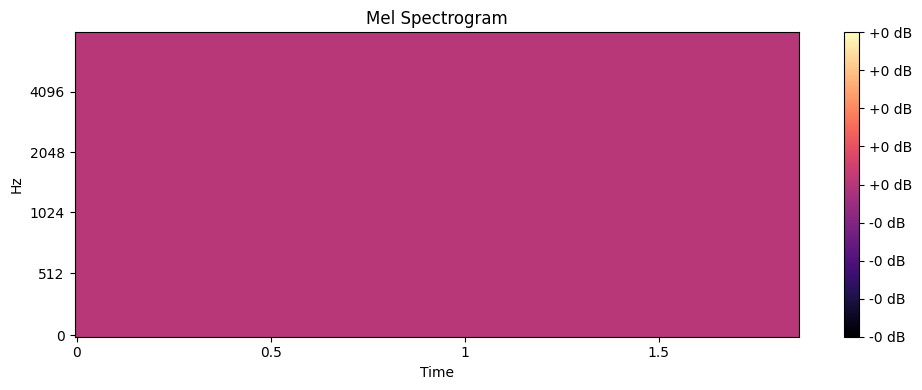

Playing ../../recordings/stageI/612/a5.wav with label 0


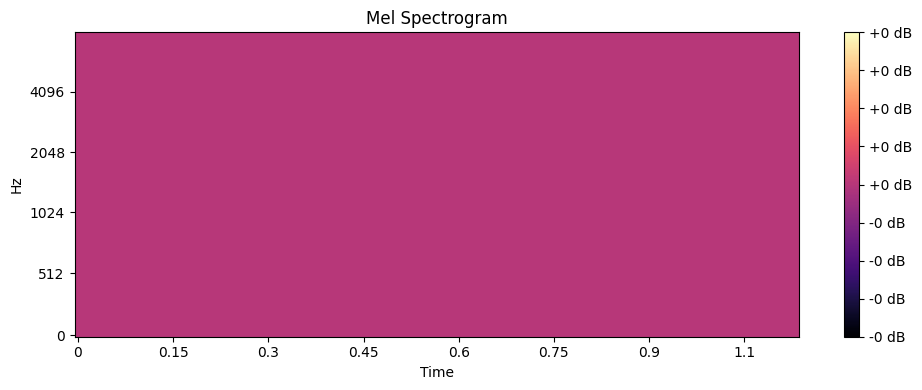

Playing ../../recordings/stageI/61/a9.wav with label 0


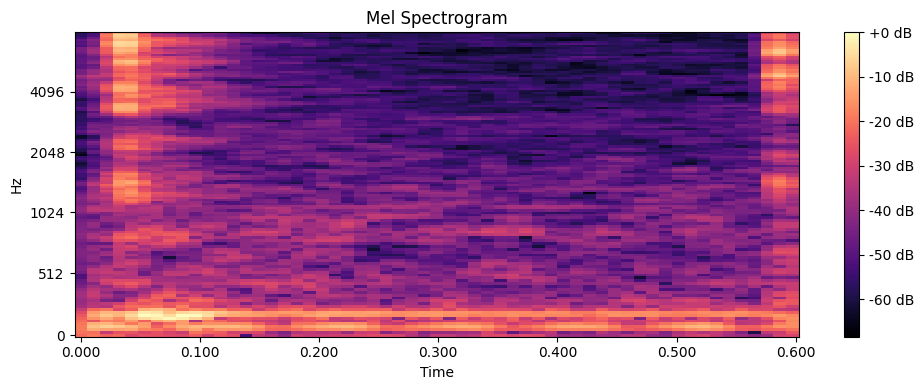

In [119]:
noisy_df = df[df['rms'] < noise_threshold]
print("\nLiczba nagrań z za dużym szumem:", len(noisy_df))
display_listenable_audio(noisy_df.sample(n=3, random_state=None))


In [120]:
df = df[df['rms'] >= noise_threshold]
print("\nLiczba nagrań po usunięciu:", len(df))


Liczba nagrań po usunięciu: 5823


### Usunięcie krótkich nagrań

In [121]:
duration_seconds_threshold = 0.5

In [122]:
df['duration'] = df['audio'].apply(lambda x: librosa.get_duration(y=x[0], sr=x[1]))


Liczba nagrań z za krótkim czasem trwania: 8
Playing ../../recordings/stageI/668/a8.wav with label 0


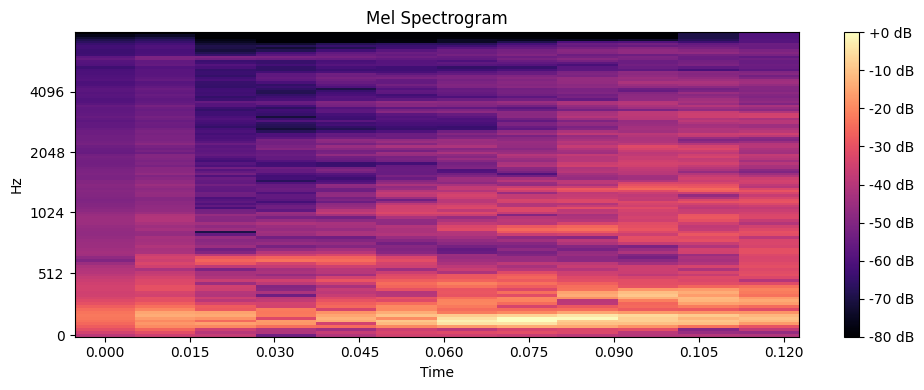

Playing ../../recordings/stageI/668/a5.wav with label 0


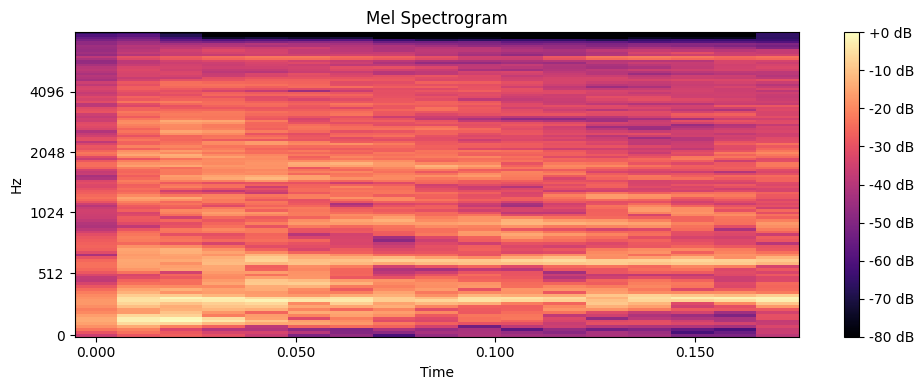

Playing ../../recordings/stageI/668/a1.wav with label 0


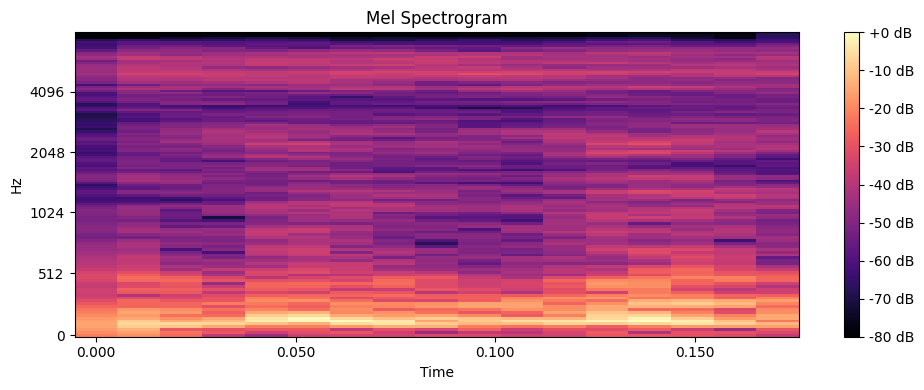

In [123]:
short_df = df[df['duration'] < duration_seconds_threshold]
print("\nLiczba nagrań z za krótkim czasem trwania:", len(short_df))
display_listenable_audio(short_df.sample(n=3, random_state=None))

In [124]:
df = df[df['duration'] > duration_seconds_threshold]
print("\nLiczba nagrań po usunięciu:", len(df))


Liczba nagrań po usunięciu: 5815


### Usunięcie ciszy z nagrań

In [125]:
top_db = 30

In [126]:
def remove_silence(audio, sr, top_db=30):
    trimmed_audio, _ = librosa.effects.trim(audio, top_db=top_db)
    return trimmed_audio
df['trimmed_audio'] = df['audio'].apply(lambda x: (remove_silence(x[0], x[1]), x[1]))

Playing ../../recordings/stageI/1292/a4.wav with label 0


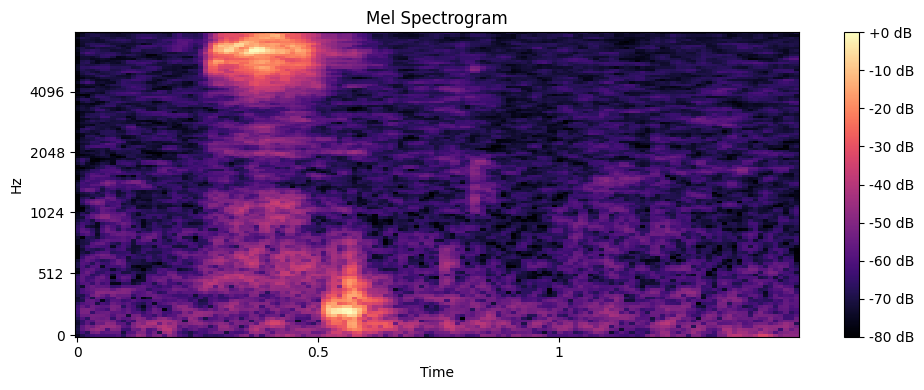

trimmed_audio


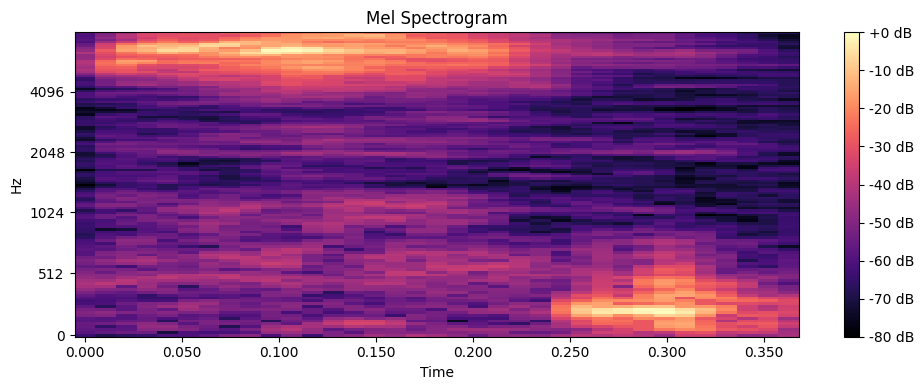

Playing ../../recordings/stageI/737/a6.wav with label 1


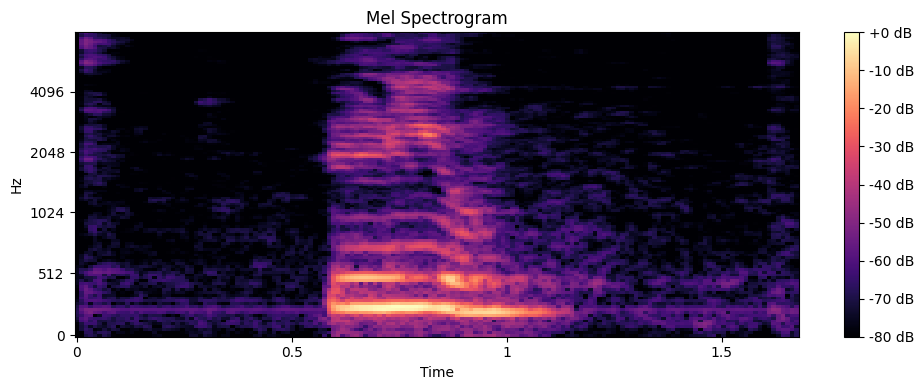

trimmed_audio


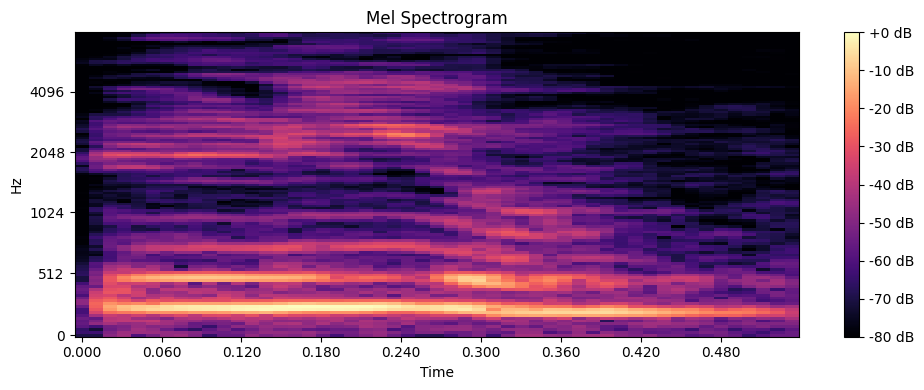

Playing ../../recordings/stageI/1406/a3.wav with label 1


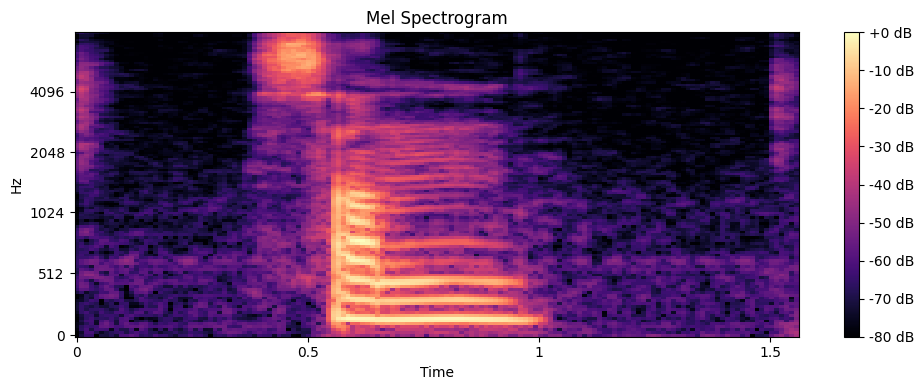

trimmed_audio


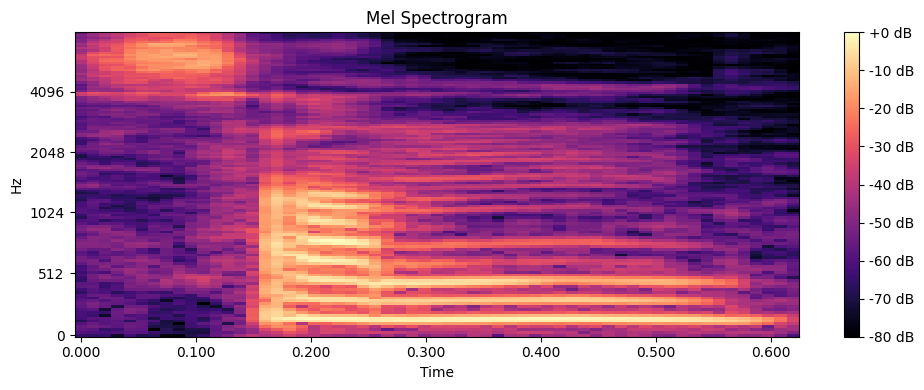

In [127]:
display_listenable_audio(df.sample(n=3, random_state=None), ['trimmed_audio'])

In [128]:
df['audio'] = df['trimmed_audio']
df = df.drop(columns=['trimmed_audio'])

### Redukcja szumu

In [129]:
noise_profile = 0.5 
lowcut = 80
highcut = 8000

1. Redukcja szumu za pomocą profilowania szumu z początku nagrania

In [130]:


def reduce_noise_in_audio(audio, sr):
    noise_part = audio[:int(noise_profile * sr)]
    return reduce_noise(y=audio, sr=sr, y_noise=noise_part)

df['reduced_audio'] = df['audio'].apply(lambda x: (reduce_noise_in_audio(x[0], x[1]), x[1]))

2. Filtry pasmowe

In [131]:
def butter_bandpass_filter(audio, sr):
    nyquist = 0.5 * sr
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(1, [low, high], btype='band')
    return lfilter(b, a, audio)

df['reduced_audio2'] = df['reduced_audio'].apply(lambda x: (butter_bandpass_filter(x[0], x[1]), x[1]))

3. Redukcja szumu spektrogramu

In [132]:
def spectral_noise_reduction(audio, sr):
    # Tworzenie spektrogramu
    stft = librosa.stft(audio)
    magnitude, phase = librosa.magphase(stft)

    # Średnia amplituda jako próg
    noise_threshold = np.mean(magnitude) * 0.5
    reduced_magnitude = np.where(magnitude > noise_threshold, magnitude, 0)

    # Odwrotna transformacja
    return librosa.istft(reduced_magnitude * phase)

df['reduced_audio3'] = df['reduced_audio2'].apply(lambda x: (spectral_noise_reduction(x[0], x[1]), x[1]))

4. Normalizacja poziomu głośności

In [133]:
def normalize_audio(audio):
    return librosa.util.normalize(audio)

df['reduced_audio4'] = df['reduced_audio3'].apply(lambda x: (normalize_audio(x[0]), x[1]))

Playing ../../recordings/stageI/1043/a4.wav with label 0


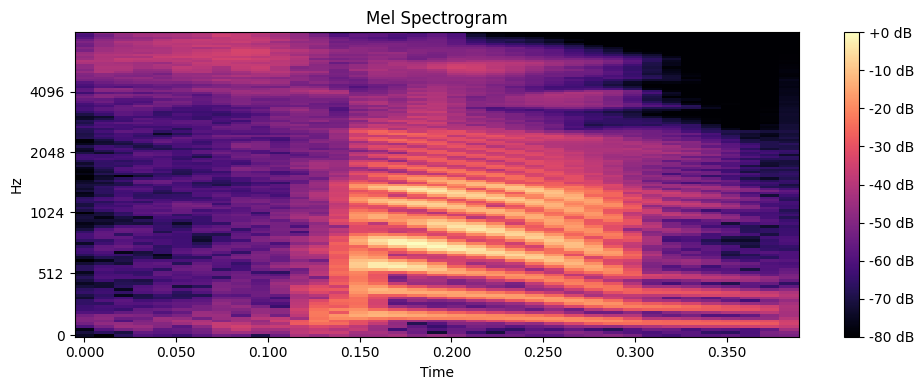

reduced_audio


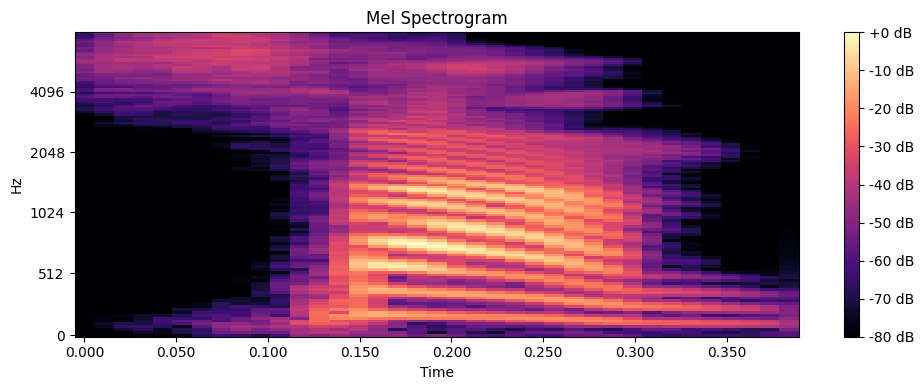

reduced_audio2


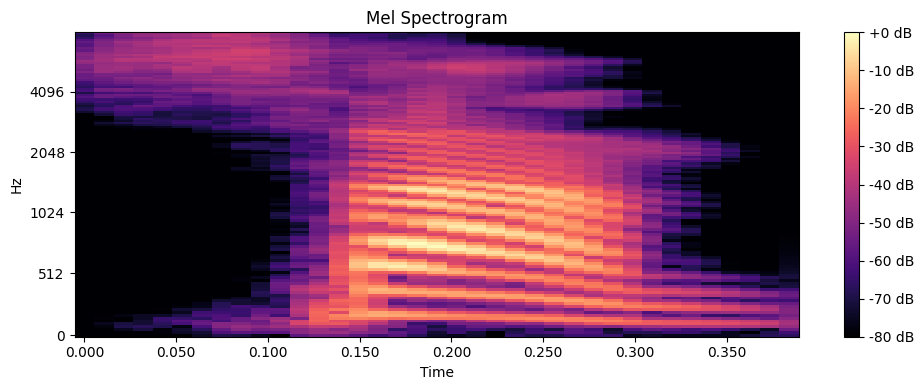

reduced_audio3


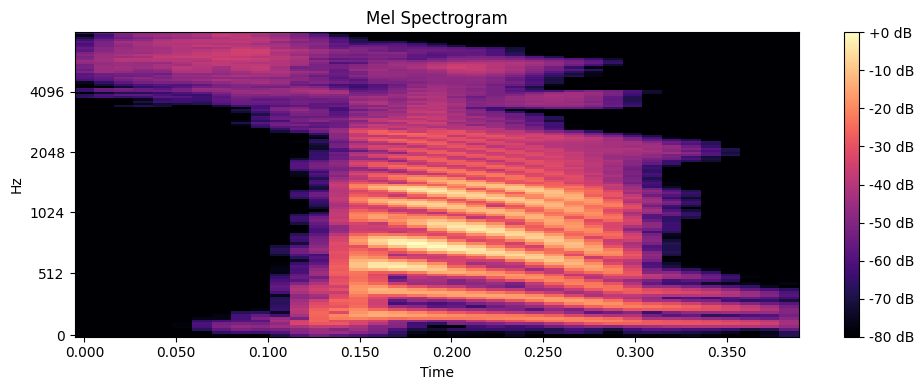

reduced_audio4


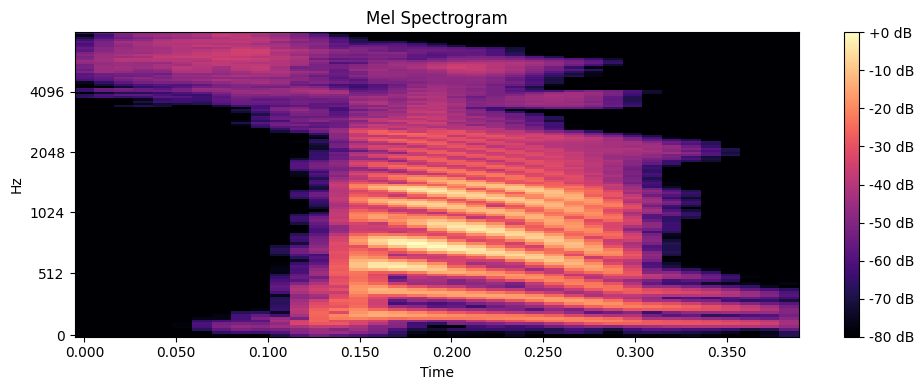

Playing ../../recordings/stageI/639/a3.wav with label 1


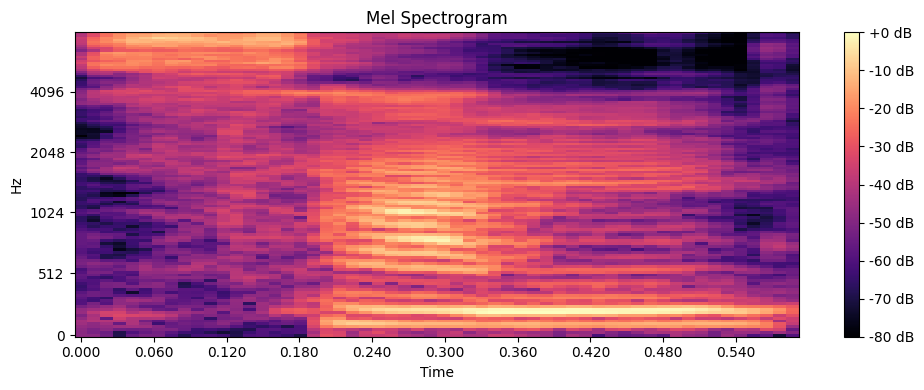

reduced_audio


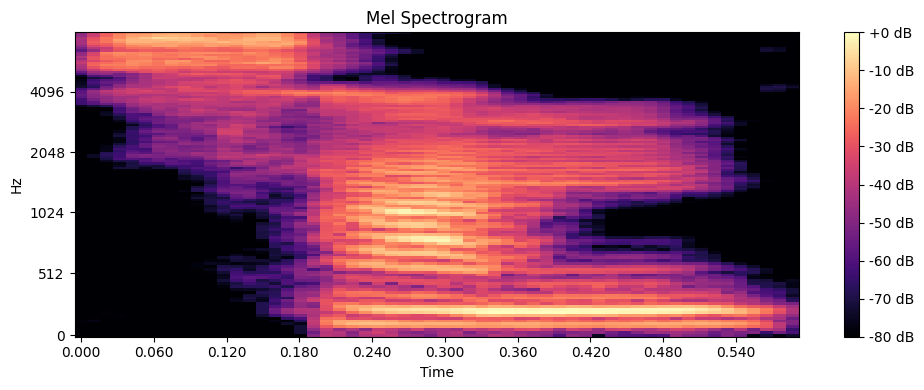

reduced_audio2


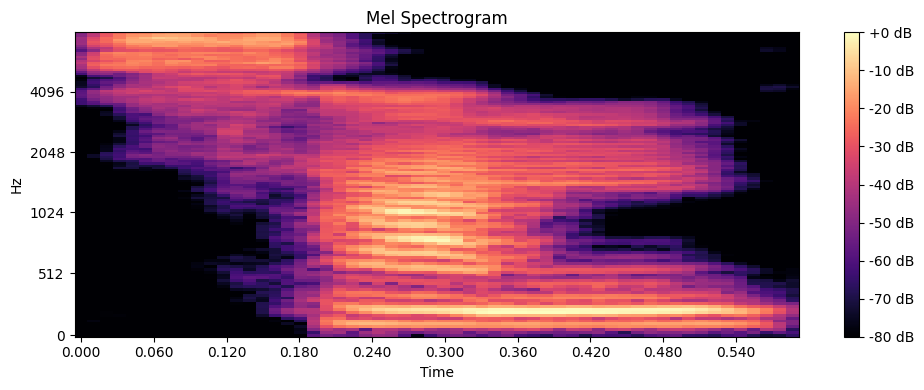

reduced_audio3


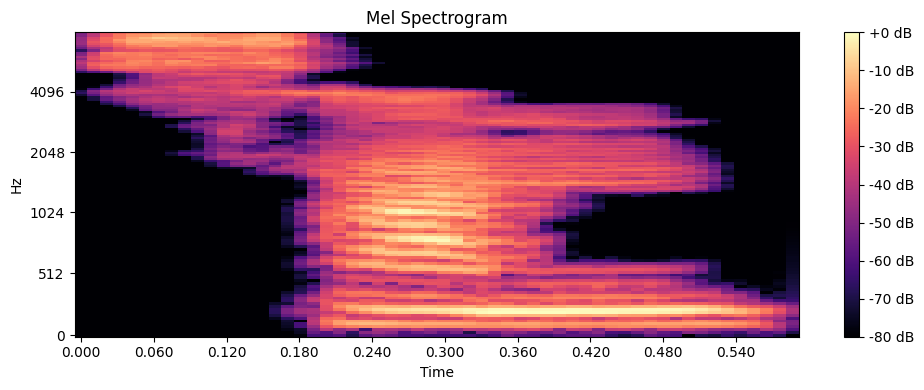

reduced_audio4


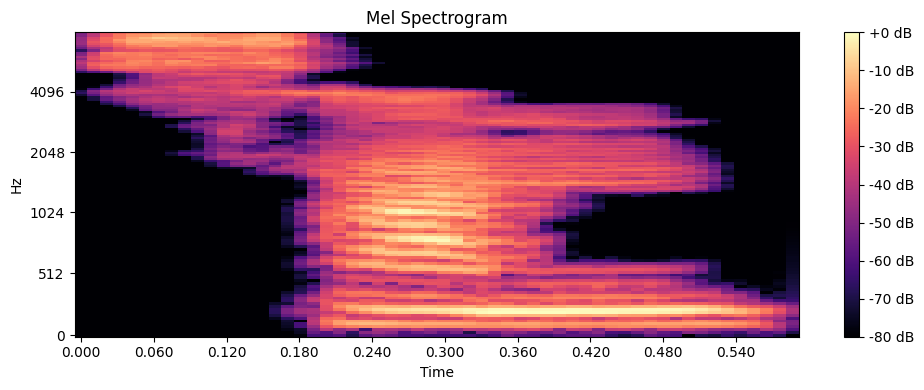

Playing ../../recordings/stageI/1315/a5.wav with label 0


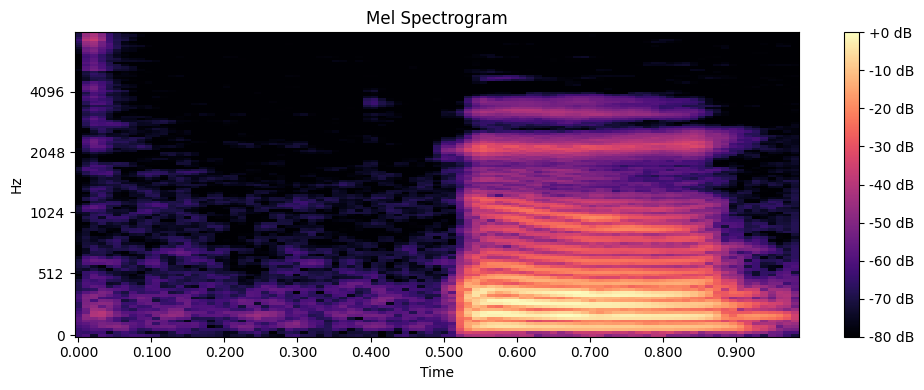

reduced_audio


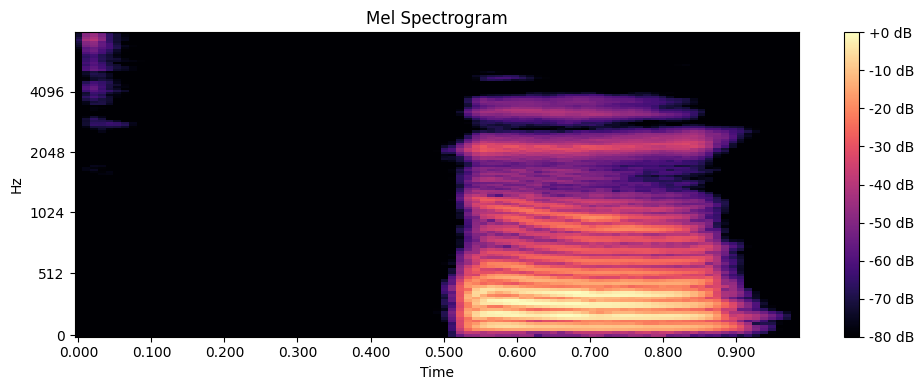

reduced_audio2


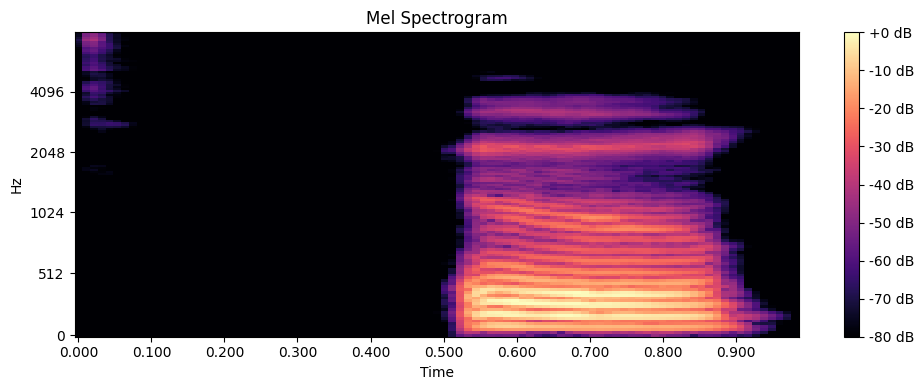

reduced_audio3


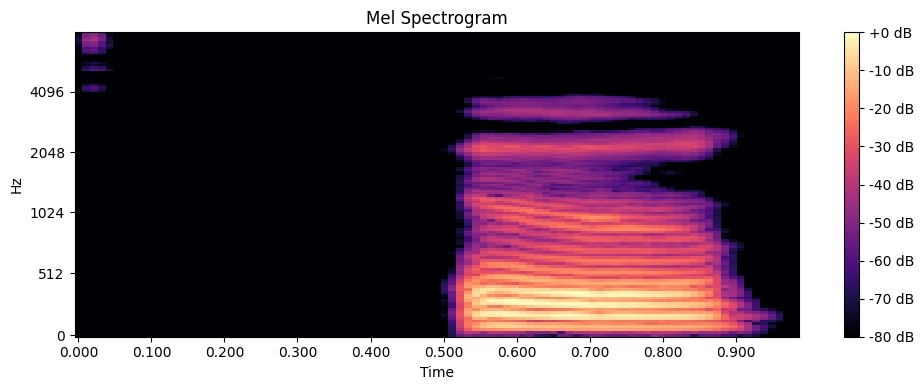

reduced_audio4


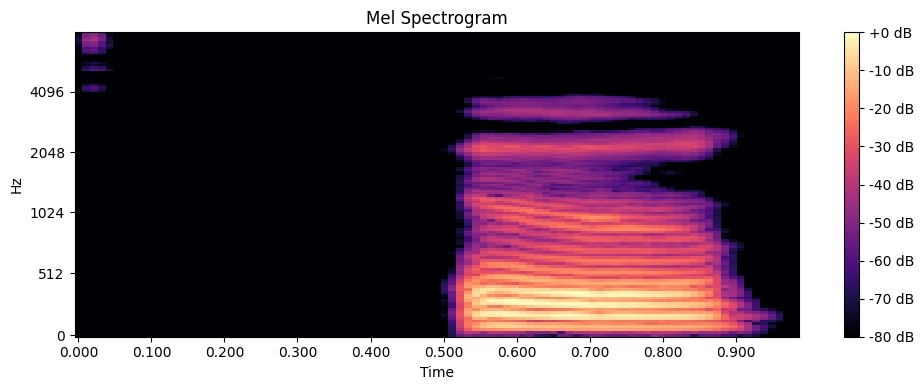

In [134]:
display_listenable_audio(df.sample(n=3, random_state=None), ['reduced_audio', 'reduced_audio2', 'reduced_audio3', 'reduced_audio4'])

In [135]:
df['audio'] = df['reduced_audio4']
df = df.drop(columns=['reduced_audio', 'reduced_audio2', 'reduced_audio3', 'reduced_audio4'])

### Standaryzacja pasma częstotliwości

In [136]:
target_sr = 16000

In [137]:
def resample_audio(audio, sr):
    if sr != target_sr:
        audio = librosa.resample(audio, orig_sr=sr, target_sr=target_sr)
    return audio, target_sr

df['resampled_audio'] = df['audio'].apply(lambda x: resample_audio(x[0], x[1]))

In [138]:
print("Stare częstotliwości próbkowania:", df['audio'].apply(lambda x: x[1]).unique())
print("Nowe częstotliwości próbkowania:", df['resampled_audio'].apply(lambda x: x[1]).unique())

Stare częstotliwości próbkowania: [48000 44100]
Nowe częstotliwości próbkowania: [16000]


Playing ../../recordings/stageI/387/a8.wav with label 0


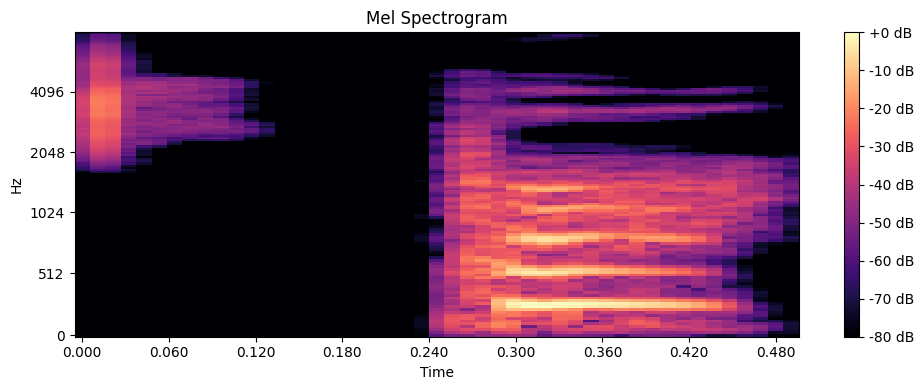

resampled_audio


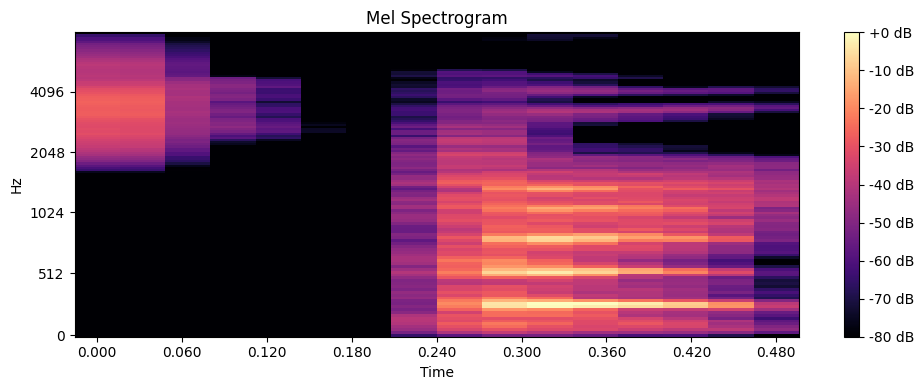

Playing ../../recordings/stageI/557/a6.wav with label 1


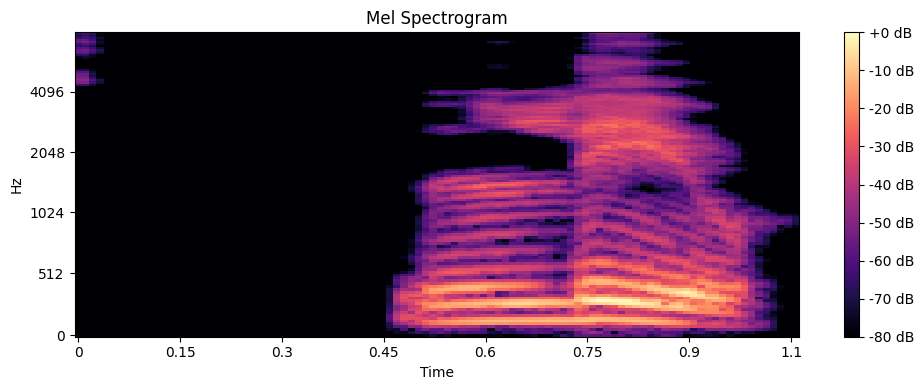

resampled_audio


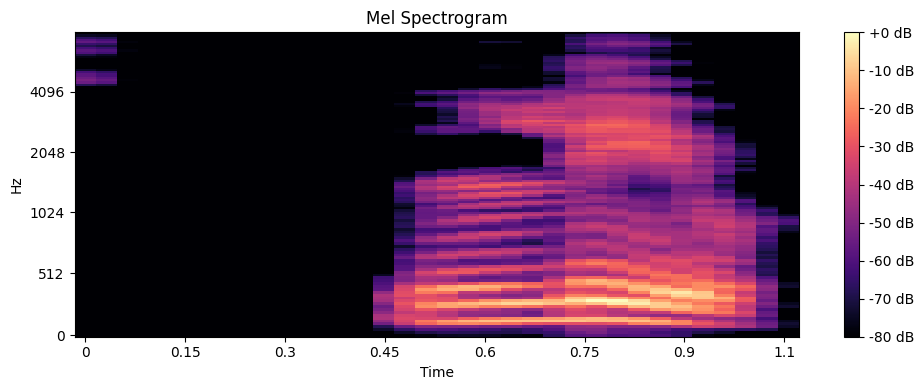

Playing ../../recordings/stageI/517/a6.wav with label 1


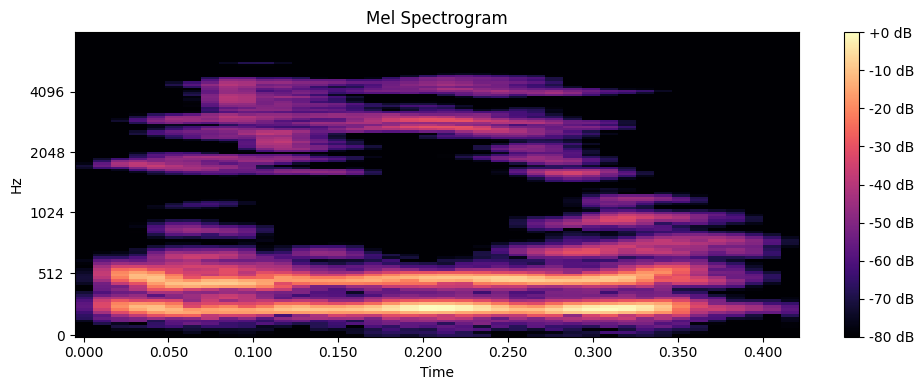

resampled_audio


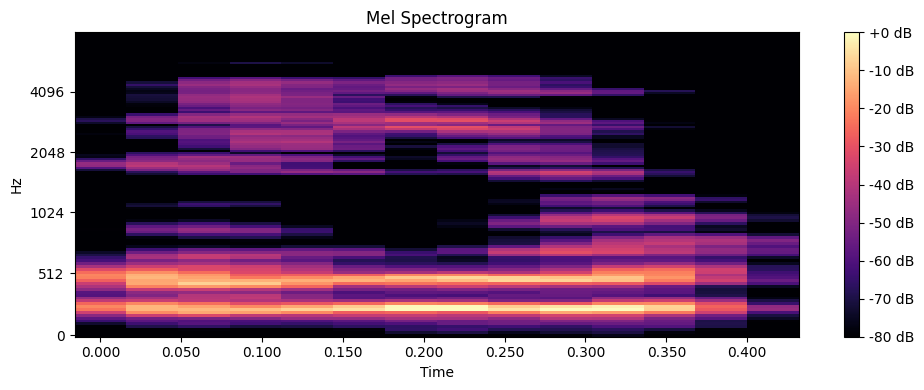

In [139]:
display_listenable_audio(df.sample(n=3, random_state=None), ['resampled_audio'])

In [140]:
df['audio'] = df['resampled_audio']
df = df.drop(columns=['resampled_audio'])

### Usunięcie ekstremalnie długich nagrań

In [141]:
df['length_samples'] = df['audio'].apply(lambda x: len(x[0]))

In [143]:
df_sorted = df.sort_values(by='length_samples', ascending=False)
top_5_longest = df_sorted.head(5)
print("5 najdłuższych nagrań (liczba próbek):")
for idx, row in top_5_longest.iterrows():
    print(f"{idx}: {row['length_samples']} próbek")
average_length = df['length_samples'].mean()
print(f"Średnia długość wszystkich próbek wynosi {average_length:.2f} próbek.")
print(f"Liczba elementów {len(df)} elementów przed usunięciem ekstremalnie długich próbek.")

5 najdłuższych nagrań (liczba próbek):
5824: 71851 próbek
4338: 58539 próbek
1590: 56491 próbek
1599: 56491 próbek
1600: 56491 próbek
Średnia długość wszystkich próbek wynosi 14294.90 próbek.
Liczba elementów 5815 elementów przed usunięciem ekstremalnie długich próbek.


In [144]:
threshold = df['length_samples'].quantile(0.95)
print(f"threshold: {threshold}")
df_filtered = df[df['length_samples'] <= threshold]

threshold: 31915.0


In [145]:
df_sorted = df_filtered.sort_values(by='length_samples', ascending=False)
top_5_longest = df_sorted.head(5)
print("5 najdłuższych nagrań (liczba próbek):")
for idx, row in top_5_longest.iterrows():
    print(f"{idx}: {row['length_samples']} próbek")
average_length = df['length_samples'].mean()
print(f"Średnia długość wszystkich próbek wynosi {average_length:.2f} próbek.")

5 najdłuższych nagrań (liczba próbek):
691: 31915 próbek
1524: 31915 próbek
5678: 31915 próbek
1319: 31744 próbek
1110: 31744 próbek
Średnia długość wszystkich próbek wynosi 14294.90 próbek.


In [146]:
print(f"Pozostało {len(df)} elementów przed usunięciem ekstremalnie długich próbek.")
df = df_filtered
print(f"Pozostało {len(df)} elementów po usunięciu ekstremalnie długich próbek.")

Pozostało 5815 elementów przed usunięciem ekstremalnie długich próbek.
Pozostało 5525 elementów po usunięciu ekstremalnie długich próbek.


### Wyrównanie długości nagrań do najdłuższego

In [ ]:
def pad_to_max_length(audio, max_length):
    if len(audio) < max_length:
        return np.pad(audio, (0, max_length - len(audio)), mode='constant')
    elif len(audio) > max_length:
        return audio[:max_length]
    return audio
max_length = df['length_samples'].max()
df['pad_audio'] = df['audio'].apply(lambda x: (pad_to_max_length(x[0], max_length), x[1]))

In [148]:
print("Stare długości nagrań:", df['audio'].apply(lambda x: len(x[0])).unique())
print("Nowe długości nagrań:", df['pad_audio'].apply(lambda x: len(x[0])).unique())

Stare długości nagrań: [16214 14507 17920 14166 25600 12971  8022  8704 26624  7680 29014 27819
 28331 23723 20139 24918 29355 26795 10752  5120 11094  9046  8534  6486
  9387 20651 11264 16726  6827  7339 10923 10411  6144  5632  7851  7168
  6656  9216 11435  9558  6998  4779  4267 11606  5974 23382 17750 24064
 30208 27648 25942 18432 13142 17579 31574  4950  5462  9899 22870  6315
 10240 18944 17067 20992 15019  7510 13995 14678 12800 27136 18774 19798
 20480 11947 12459 12288 14848 12630 10582 18262  9728  8363 13483 17238
 22528 22358 14336 16896 19115 11776 27307 12118 21504 16384 24576 22016
 19456  3414  4608 29696 26454 28160 30379 15531 24235 19286 30720 21334
  4096 20310 18603 22187  5803  5291 29867 22699 21675 15702 13824 23894
 23040 15360 31403 28672  8192  8875 21163 17408 13312 25259 19968  4438
 25771 10070 25088 24406  2902  3584 16555 26966 18091 19627 20822 15190
 23552 24747 31232 30550 31915 27478 16043 25430 15872  1366  3243 26112
 31062 21846 23211 30038 317

Playing ../../recordings/stageI/1457/a7.wav with label 0


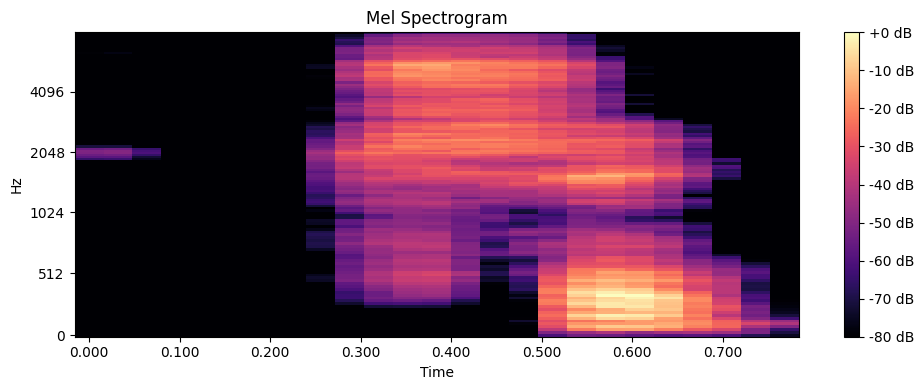

pad_audio


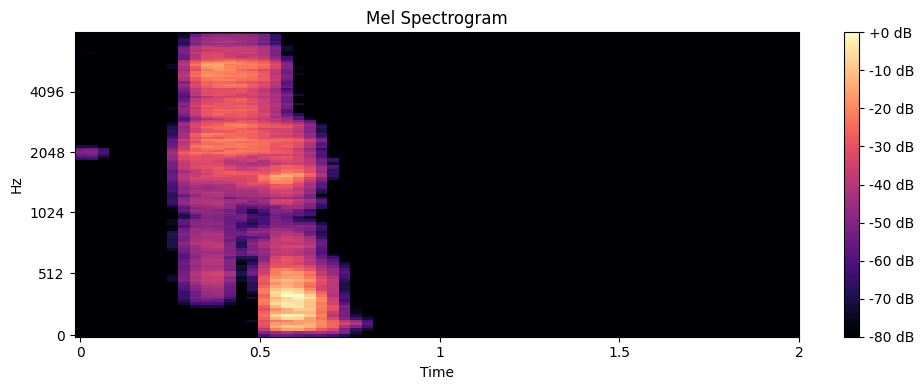

Playing ../../recordings/stageI/356/a2.wav with label 1


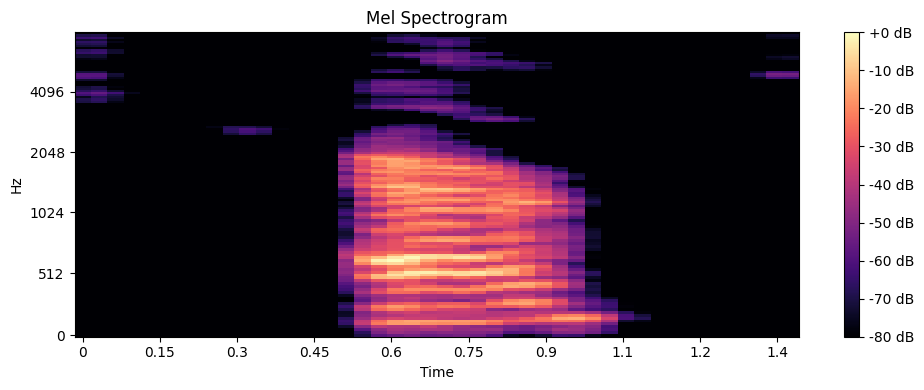

pad_audio


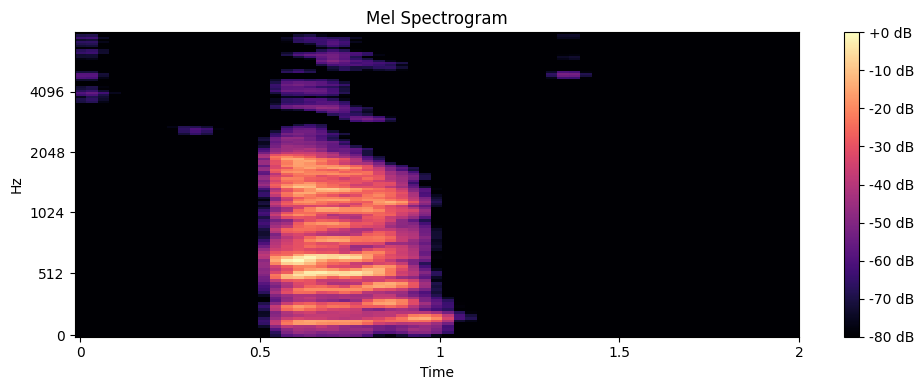

Playing ../../recordings/stageI/564/a8.wav with label 1


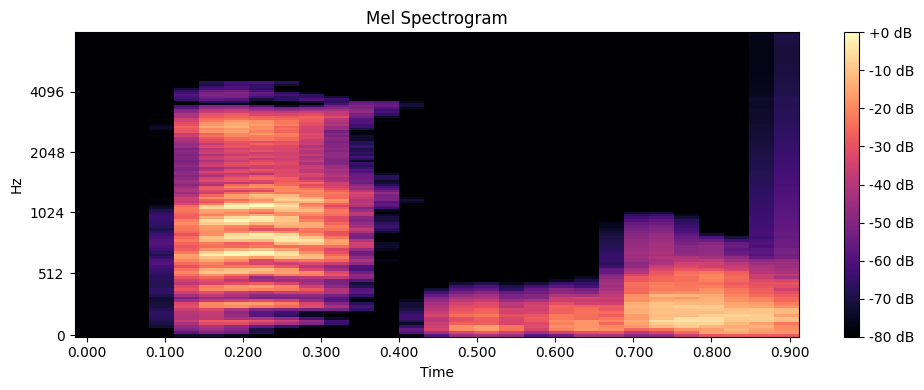

pad_audio


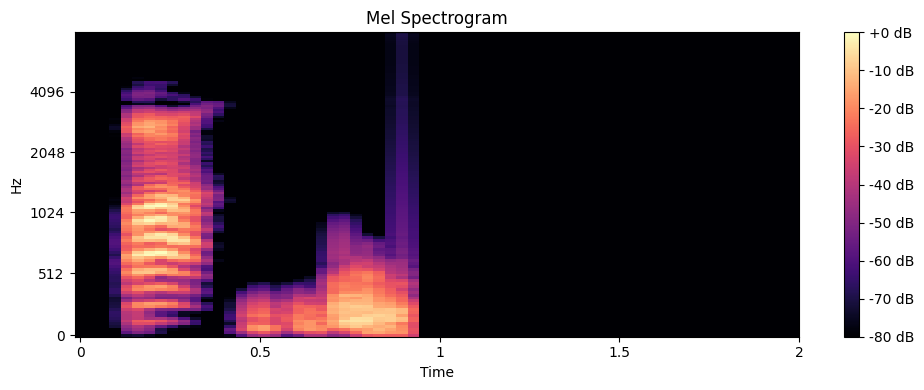

In [150]:
display_listenable_audio(df.sample(n=3, random_state=None), ['pad_audio'])

In [151]:
df['audio'] = df['pad_audio']
df = df.drop(columns=['pad_audio'])

### Augmentacja

1. Dodanie szumu - lepiej nie używać

In [152]:
noise_level = 0.005

In [153]:
def add_noise(audio):
    noise = noise_level * np.random.normal(0, 1, len(audio))
    return audio + noise

df['augmented_noise'] = df['audio'].apply(lambda x: (add_noise(x[0]), x[1]))

Playing ../../recordings/stageI/616/a9.wav with label 0


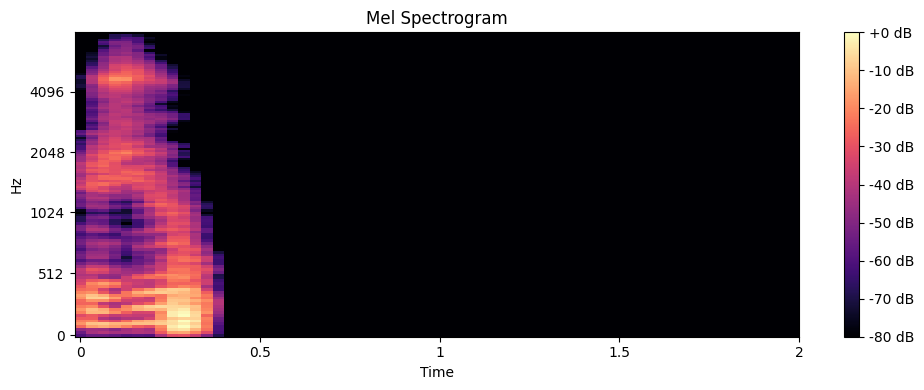

augmented_noise


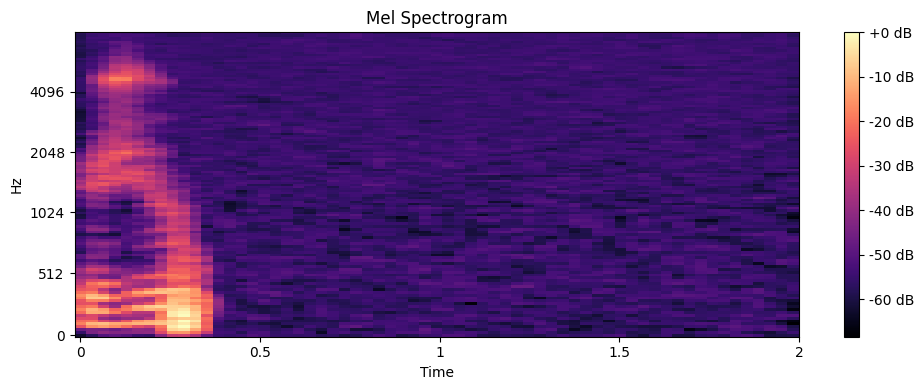

Playing ../../recordings/stageI/1058/a5.wav with label 1


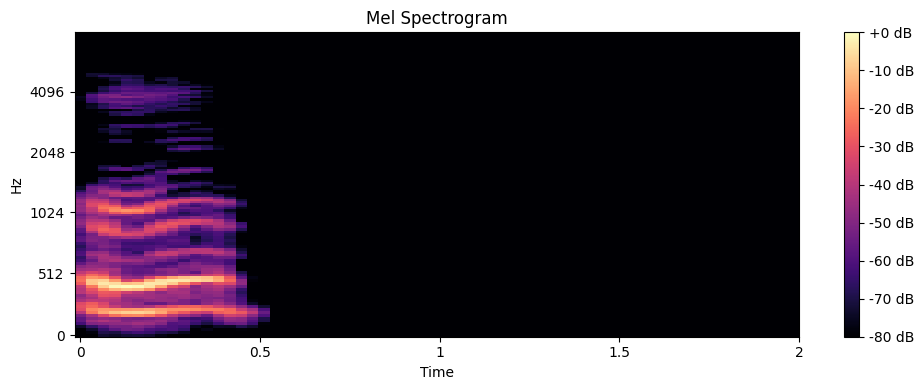

augmented_noise


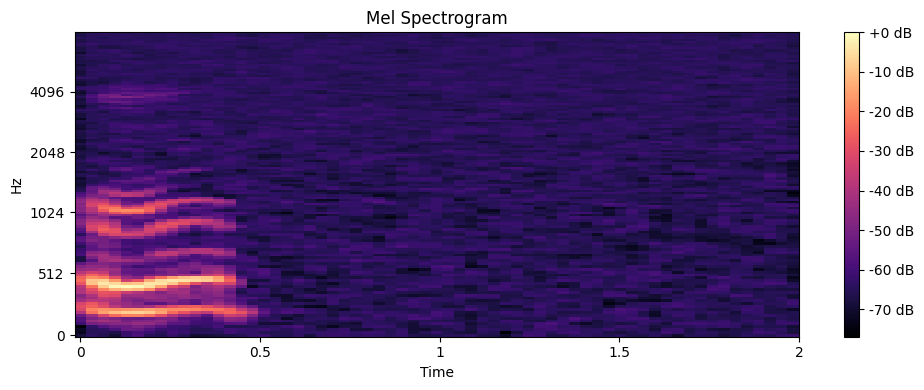

Playing ../../recordings/stageI/410/a2.wav with label 0


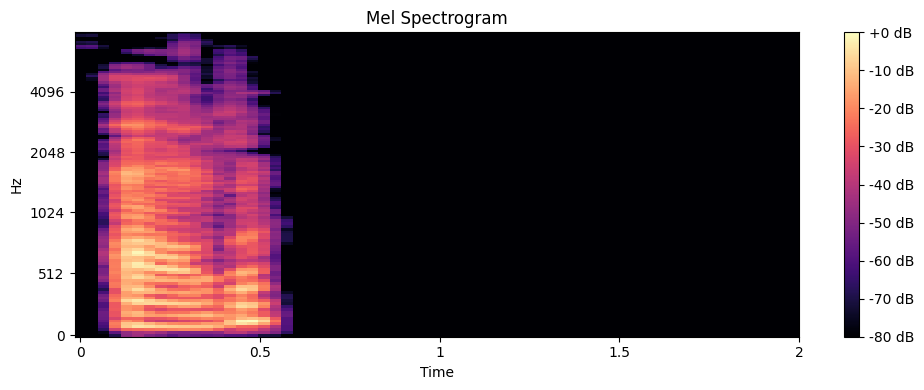

augmented_noise


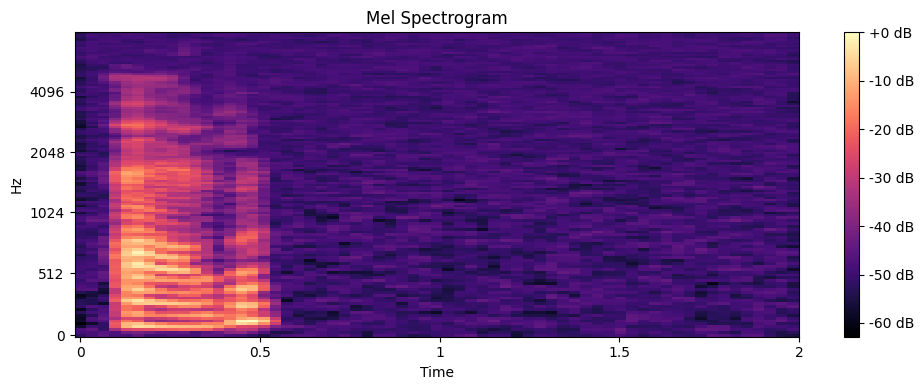

In [154]:
display_listenable_audio(df.sample(n=3, random_state=None), ['augmented_noise'])

2. Zmiana szybkości

In [ ]:
def time_stretch(audio):
    rate = np.random.uniform(0.8, 1.2)
    return librosa.effects.time_stretch(audio,rate=rate)

df['augmented_speed'] = df['audio'].apply(lambda x: (time_stretch(x[0]), x[1]))
df['augmented_speed'] = df['augmented_speed'].apply(lambda x: (pad_to_max_length(x[0], max_length), x[1]))

Playing ../../recordings/stageI/598/a1.wav with label 1


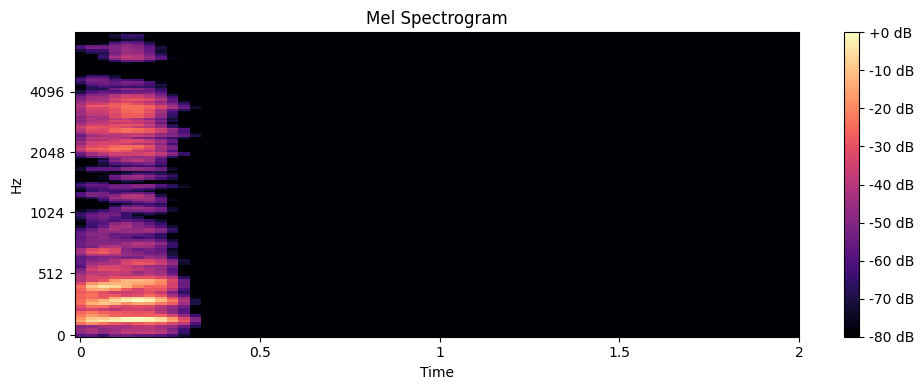

augmented_speed


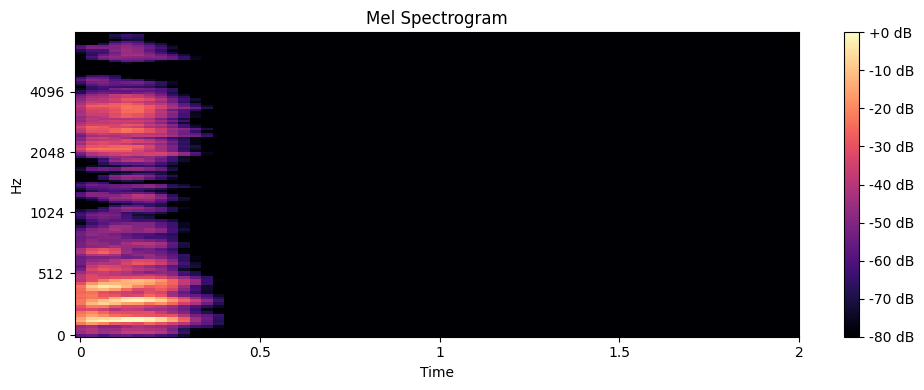

Playing ../../recordings/stageI/496/a3.wav with label 1


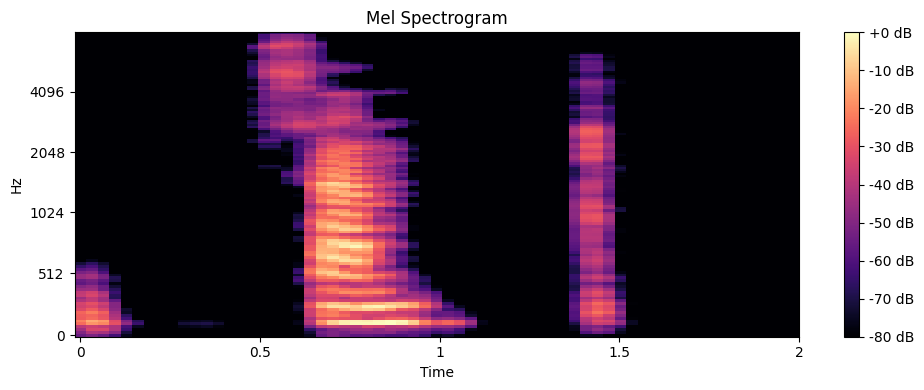

augmented_speed


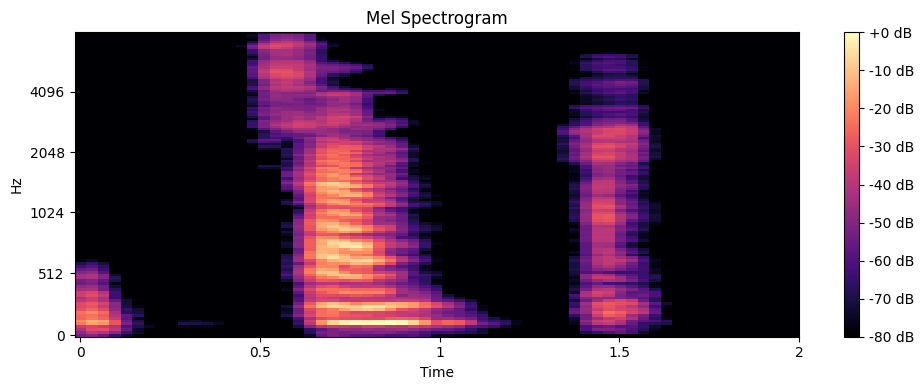

Playing ../../recordings/stageI/460/a5.wav with label 0


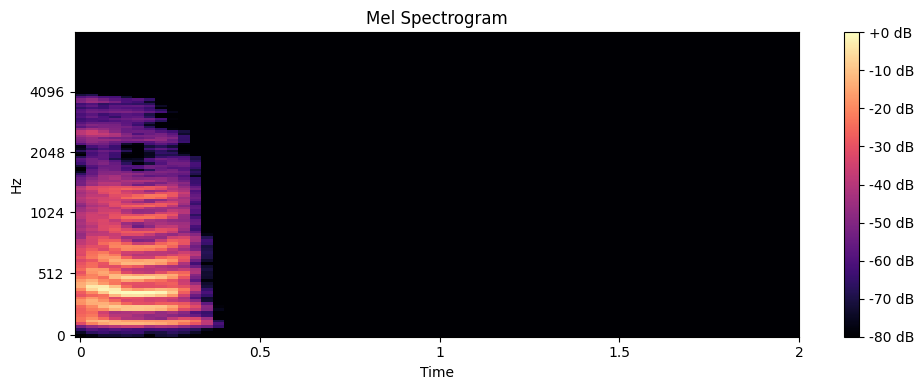

augmented_speed


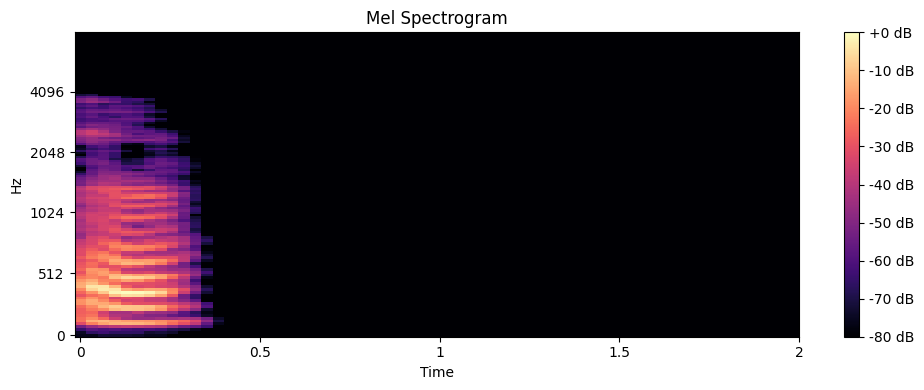

In [162]:
display_listenable_audio(df.sample(n=3, random_state=None), ['augmented_speed'])

3. zmiana wysokości tonów

In [163]:
def pitch_shift(audio, sr):
    n_steps = np.random.uniform(-2, 2)
    return librosa.effects.pitch_shift(audio, sr=sr, n_steps=n_steps)

df['augmented_tone'] = df['audio'].apply(lambda x: (pitch_shift(x[0], x[1]), x[1]))

Playing ../../recordings/stageI/1021/a5.wav with label 1


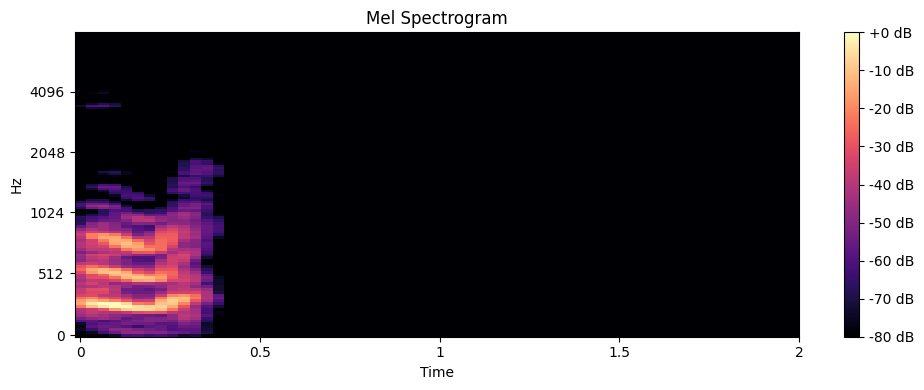

augmented_tone


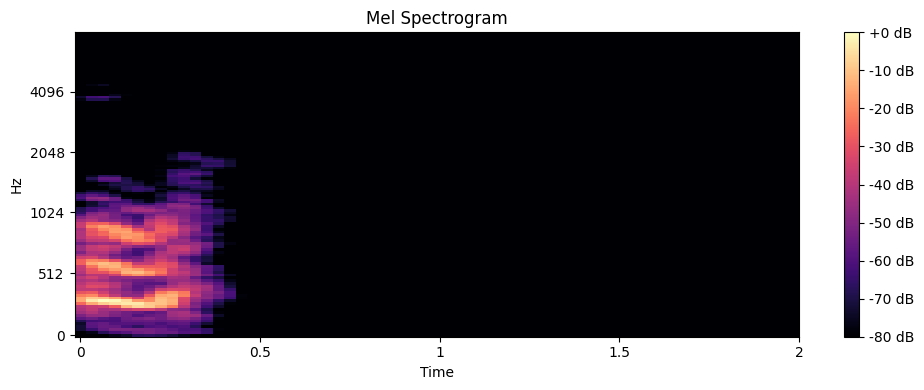

Playing ../../recordings/stageI/1401/a1.wav with label 1


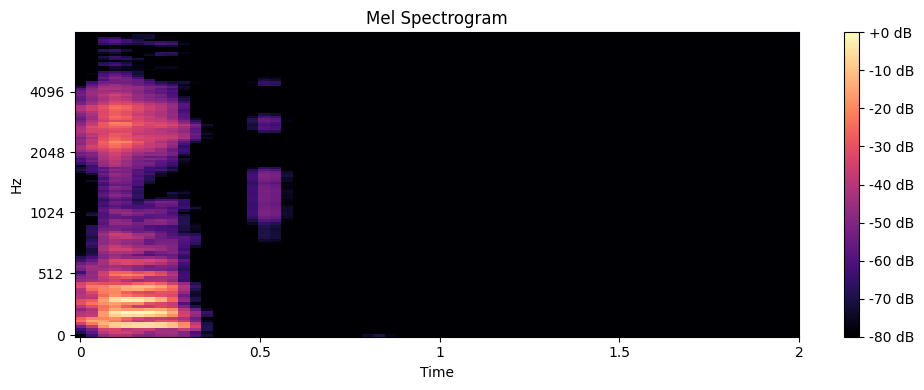

augmented_tone


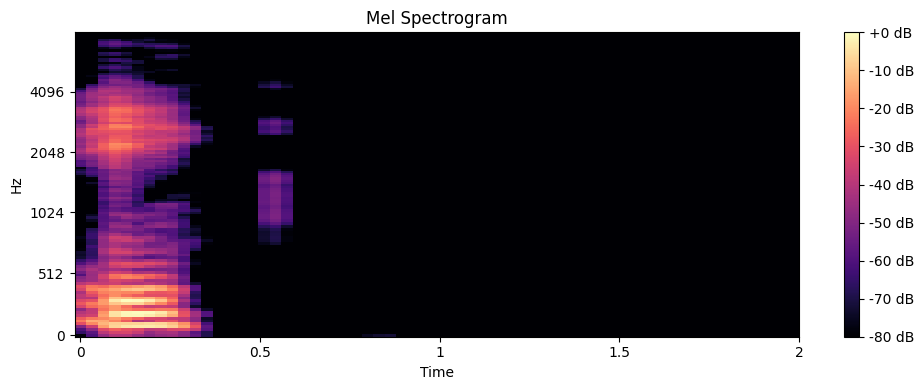

Playing ../../recordings/stageI/553/a6.wav with label 0


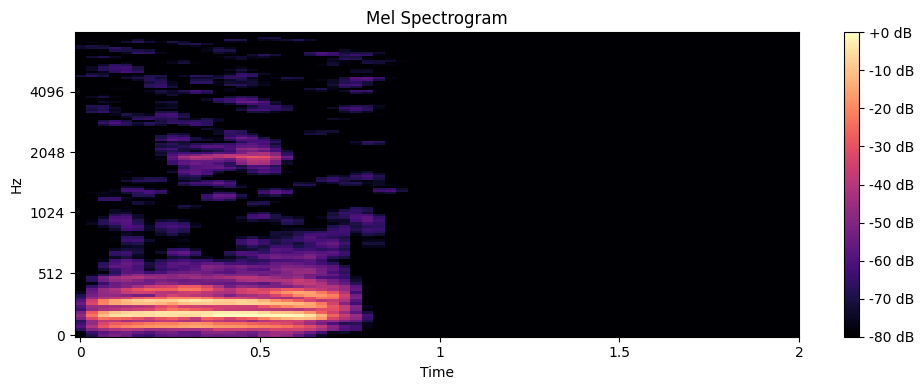

augmented_tone


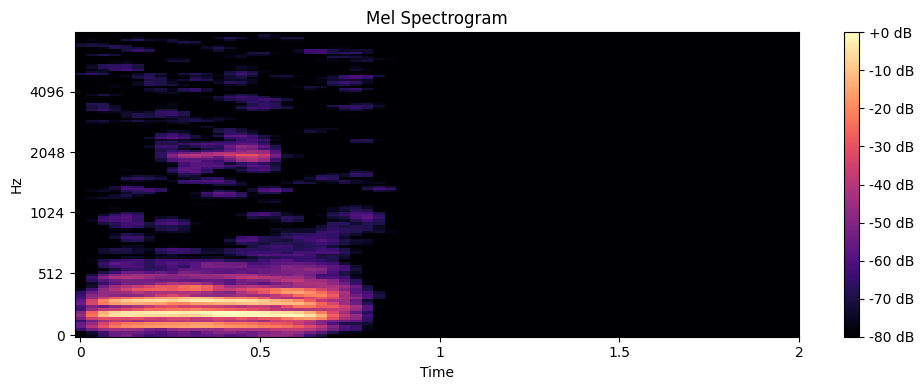

In [164]:
display_listenable_audio(df.sample(n=3, random_state=None), ['augmented_tone'])

4. Zmiana głośności - chyba nic nie daje

In [171]:
def change_volume(audio):
    factor = np.random.uniform(-1.5, 1.5)
    return audio * factor

df['augmented_volume'] = df['audio'].apply(lambda x: (change_volume(x[0]), x[1]))

Playing ../../recordings/stageI/569/a8.wav with label 1


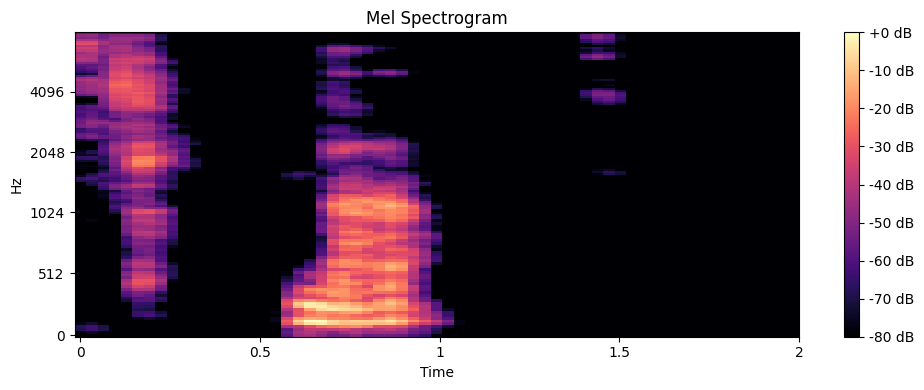

augmented_volume


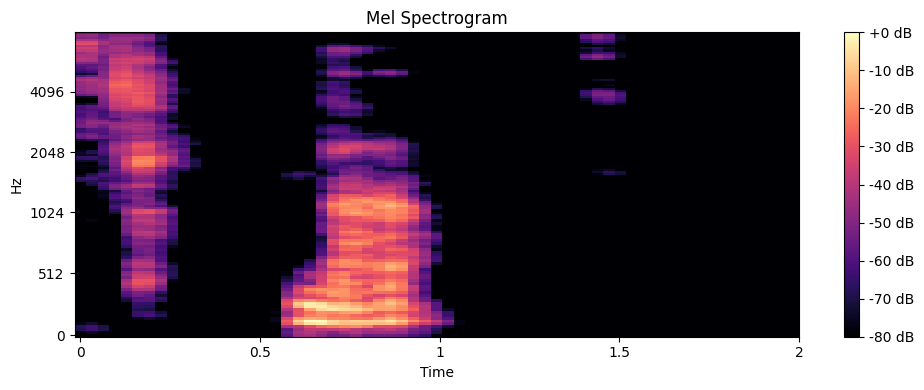

Playing ../../recordings/stageI/966/a6.wav with label 0


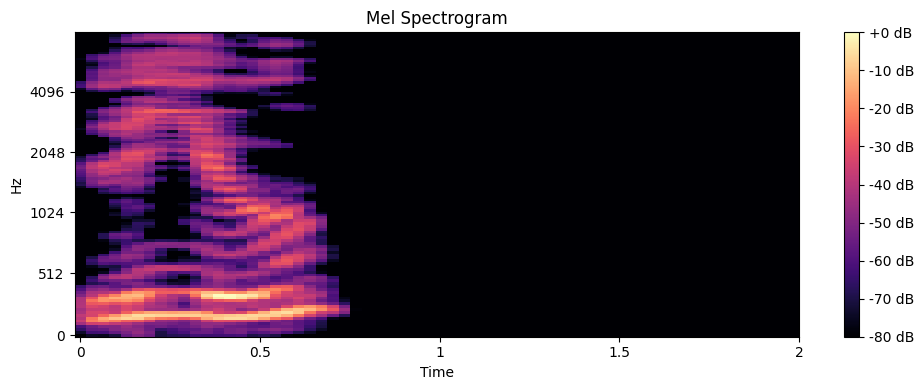

augmented_volume


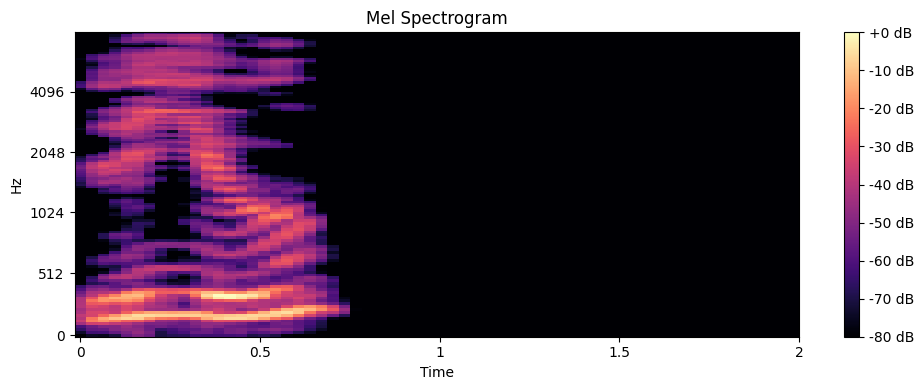

Playing ../../recordings/stageI/349/a5.wav with label 1


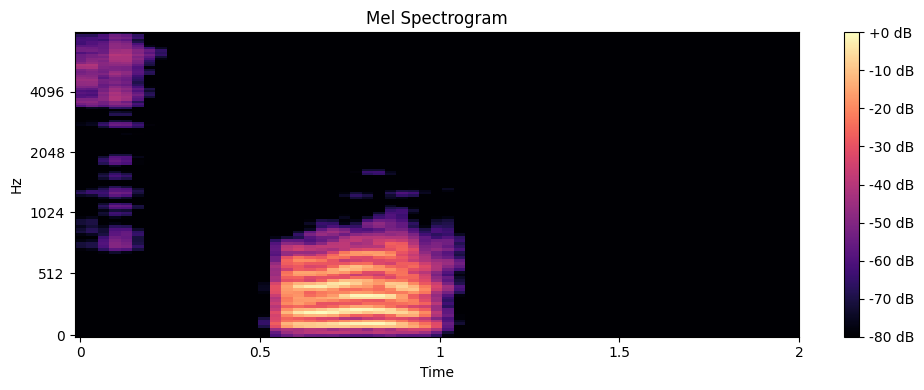

augmented_volume


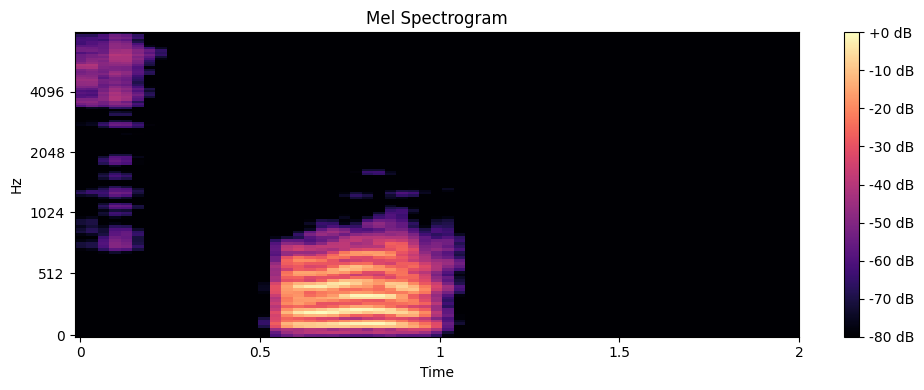

In [172]:
display_listenable_audio(df.sample(n=3, random_state=None), ['augmented_volume'])

### Zbalansowanie klas

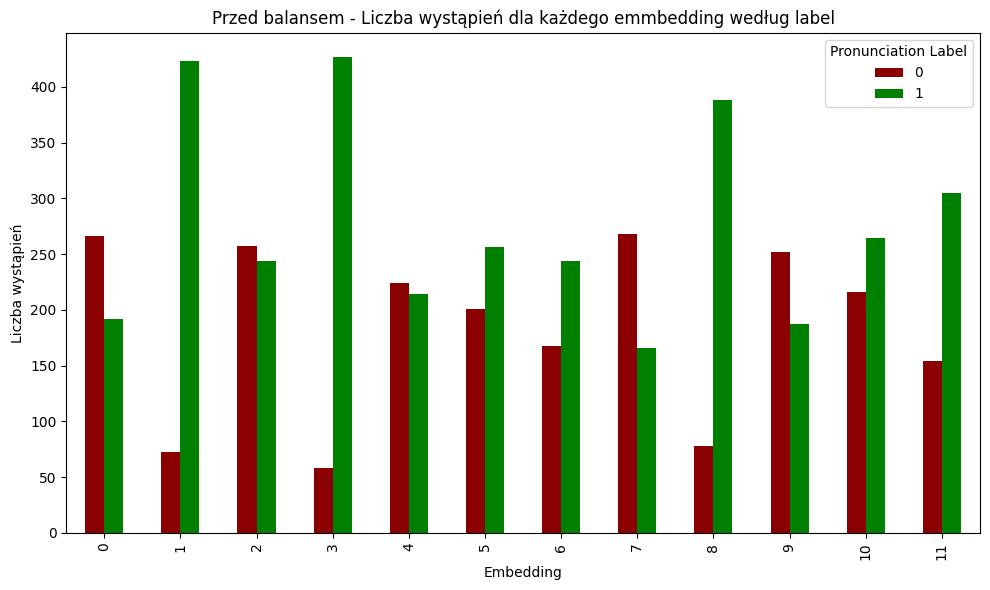

In [173]:
grouped_data = df.groupby(['embedding', 'label']).size().unstack(fill_value=0)
grouped_data.plot(kind='bar', figsize=(10, 6), color=['darkred', 'green'])
plt.xlabel('Embedding')
plt.ylabel('Liczba wystąpień')
plt.title('Przed balansem - Liczba wystąpień dla każdego emmbedding według label')
plt.legend(title='Pronunciation Label', labels=['0', '1'])
plt.tight_layout()
plt.show()

In [174]:
def balance_classes(data):
    balanced_data = []
    for word in data['embedding'].unique():
        subset = data[data['embedding'] == word]
        class_0 = subset[subset['label'] == 0]
        class_1 = subset[subset['label'] == 1]
        
        # Znajdź minimalną liczebność między klasami
        min_size = min(len(class_0), len(class_1))
        
        # Losowy wybór próbek do wyrównania
        class_0_balanced = class_0.sample(n=min_size, random_state=42)
        class_1_balanced = class_1.sample(n=min_size, random_state=42)
        
        # Dodaj zbalansowane dane do listy
        balanced_data.append(class_0_balanced)
        balanced_data.append(class_1_balanced)
    
    # Połącz wszystkie zbalansowane dane w jeden DataFrame
    return pd.concat(balanced_data).reset_index(drop=True)\

balanced_df = balance_classes(df)

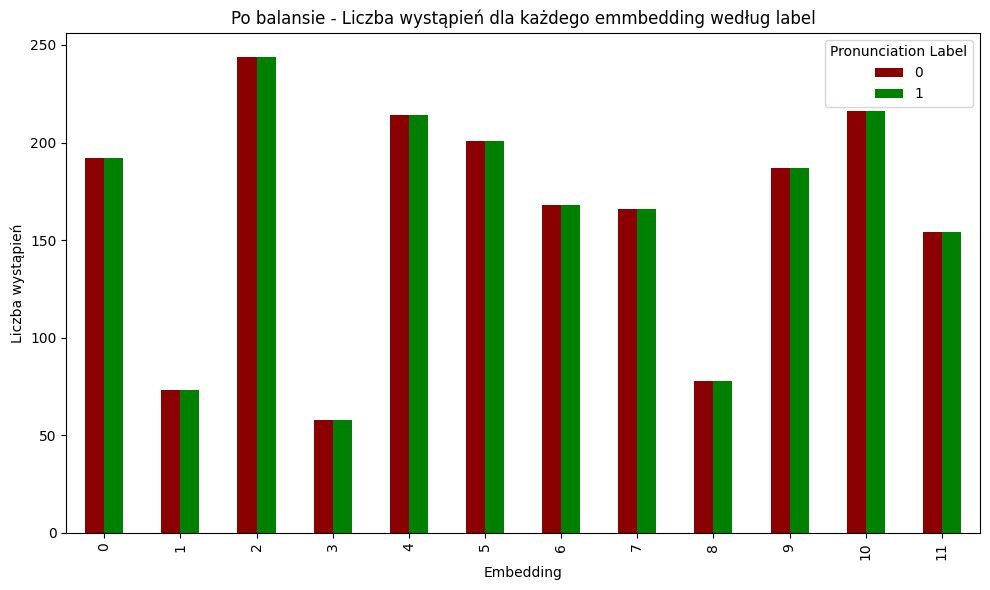

In [175]:
grouped_data = balanced_df.groupby(['embedding', 'label']).size().unstack(fill_value=0)
grouped_data.plot(kind='bar', figsize=(10, 6), color=['darkred', 'green'])
plt.xlabel('Embedding')
plt.ylabel('Liczba wystąpień')
plt.title('Po balansie - Liczba wystąpień dla każdego emmbedding według label')
plt.legend(title='Pronunciation Label', labels=['0', '1'])
plt.tight_layout()
plt.show()


### Ekstrakcja MFCC

In [176]:
def extract_mfcc(audio, sr, n_mfcc=13):
    mfcc = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=n_mfcc)
    return mfcc.T
balanced_df['mfcc'] = balanced_df['audio'].apply(lambda x: extract_mfcc(x[0], x[1]))

### Obliczenie spektogramów

In [ ]:
#balanced_df['mel_spectrogram'] = balanced_df['audio'].apply(lambda x: generate_mel_spectrogram(x[0], x[1]))

### Podział na zbiór treningowy, walidacyjny i testowy

In [177]:
train_df, temp_df = train_test_split(balanced_df, test_size=0.4, random_state=42, stratify=balanced_df['label'])
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42, stratify=temp_df['label'])

In [178]:
X_train = train_df['mfcc'].tolist()
word_indices_train = train_df['embedding'].tolist()
y_train = train_df['label'].tolist()

X_val = val_df['mfcc'].tolist()
word_indices_val = val_df['embedding'].tolist()
y_val = val_df['label'].tolist()

X_test = test_df['mfcc'].tolist()
word_indices_test = test_df['embedding'].tolist()
y_test = test_df['label'].tolist()

### Dodanie augmentacji do zbioru treningowego

In [179]:
# train_df['mel_spectrogram_speed'] = train_df['audio'].apply(lambda x: generate_mel_spectrogram(x[0], x[1]))
# train_df['mel_spectrogram_tone'] = train_df['audio'].apply(lambda x: generate_mel_spectrogram(x[0], x[1]))
train_df['mfcc_spectrogram_speed'] = train_df['augmented_speed'].apply(lambda x: extract_mfcc(x[0], x[1]))
train_df['mfcc_spectrogram_tone'] = train_df['augmented_tone'].apply(lambda x: extract_mfcc(x[0], x[1]))

In [180]:
X_augmented = train_df['mfcc_spectrogram_speed'].tolist() + train_df['mfcc_spectrogram_tone'].tolist()
word_indices_augmented = word_indices_train + word_indices_train
y_augmented = y_train + y_train

In [181]:

def pad_or_trim_mfcc(mfcc, max_length):
    if mfcc.shape[0] < max_length:
        # Padding zerami
        padding = np.zeros((max_length - mfcc.shape[0], mfcc.shape[1]))
        return np.vstack([mfcc, padding])
    else:
        # Przycięcie
        return mfcc[:max_length, :] 
label_encoder = LabelEncoder()


max_length =max(
    max(mfcc.shape[0] for mfcc in X_train),
    max(mfcc.shape[0] for mfcc in X_val),
    max(mfcc.shape[0] for mfcc in X_test),
    max(mfcc.shape[0] for mfcc in X_augmented)
    ) 

X_train = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_train])
X_train = X_train[..., np.newaxis]
word_indices_train = np.array(word_indices_train)
y_train = np.array(y_train)
y_train = label_encoder.fit_transform(y_train)

X_val = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_val])
X_val = X_val[..., np.newaxis]
word_indices_val = np.array(word_indices_val)
y_val = np.array(y_val)
y_val = label_encoder.fit_transform(y_val)

X_test = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_test])
X_test = X_test[..., np.newaxis]
word_indices_test = np.array(word_indices_test)
y_test = np.array(y_test)
y_test = label_encoder.fit_transform(y_test)

X_augmented = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_augmented])
X_augmented = X_augmented[..., np.newaxis]
word_indices_augmented = np.array(word_indices_augmented)
y_augmented = np.array(y_augmented)
y_augmented = label_encoder.fit_transform(y_augmented)

In [182]:
print(f"Rozmiar zbioru treningowego: {X_train.shape}")
print(f"Rozmiar zbioru walidacyjnego: {X_val.shape}")
print(f"Rozmiar zbioru testowego: {X_test.shape}")

Rozmiar zbioru treningowego: (2341, 63, 13, 1)
Rozmiar zbioru walidacyjnego: (780, 63, 13, 1)
Rozmiar zbioru testowego: (781, 63, 13, 1)


In [183]:
X_train_with_augmented = np.concatenate((X_train, X_augmented), axis=0)
word_indices_train_with_augmented = np.concatenate((word_indices_train, word_indices_augmented), axis=0)
y_train_with_augmented = np.concatenate((y_train, y_augmented), axis=0)
print(f"Rozmiar zbioru treningowego po dodaniu augemntacji: {X_train_with_augmented.shape}")


Rozmiar zbioru treningowego po dodaniu augemntacji: (7023, 63, 13, 1)


### Wizualizacji rozkładu word_indices dla każdej klasy

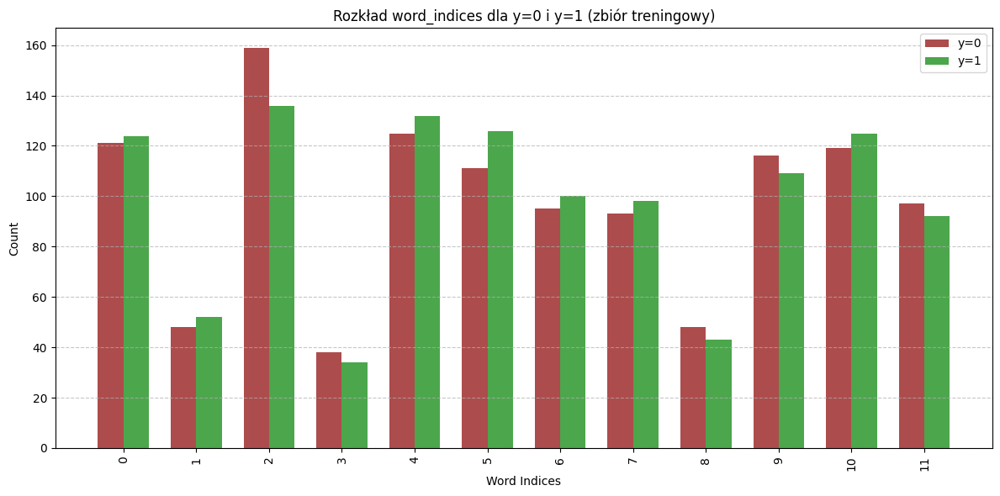

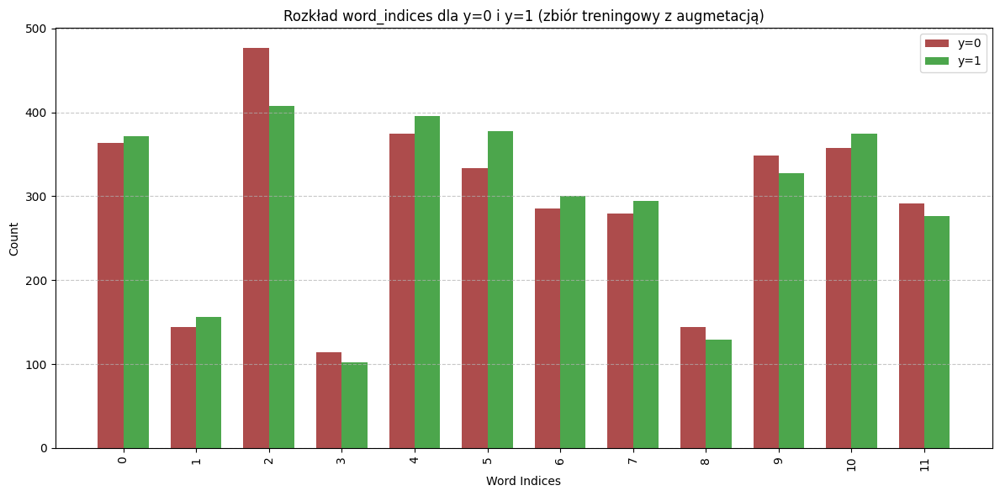

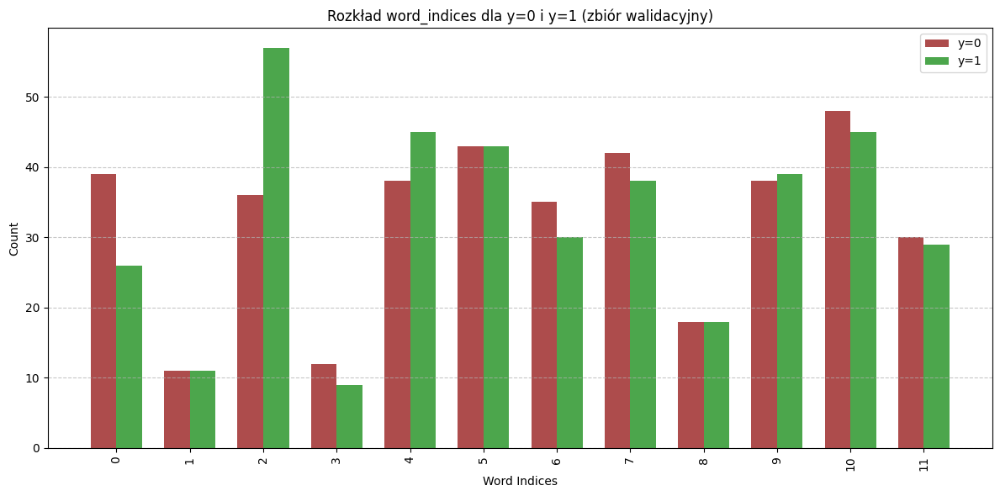

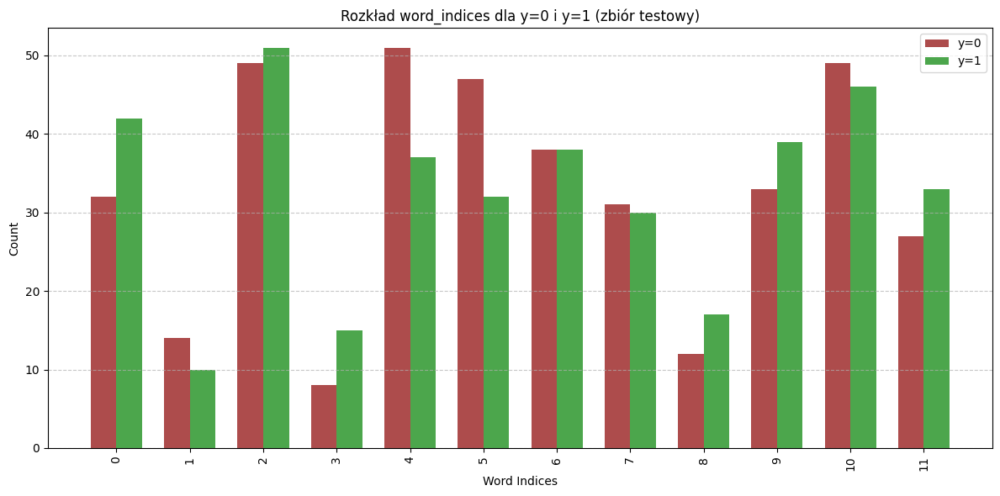

In [ ]:
def plot_word_indices_grouped(word_indices, y, title):
    unique_word_indices = np.unique(word_indices)
    unique_labels = np.unique(y)
    word_label_counts = {word: {label: 0 for label in unique_labels} for word in unique_word_indices}
    for word, label in zip(word_indices, y):
        word_label_counts[word][label] += 1
    bar_width = 0.35
    index = np.arange(len(unique_word_indices))
    counts_class_0 = [word_label_counts[word][0] for word in unique_word_indices]
    counts_class_1 = [word_label_counts[word][1] for word in unique_word_indices]
    plt.figure(figsize=(12, 6))
    plt.bar(index - bar_width / 2, counts_class_0, bar_width, label='y=0', color='darkred', alpha=0.7)
    plt.bar(index + bar_width / 2, counts_class_1, bar_width, label='y=1', color='green', alpha=0.7)
    plt.xlabel('Word Indices')
    plt.ylabel('Count')
    plt.title(title)
    plt.xticks(index, unique_word_indices, rotation=90)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

plot_word_indices_grouped(word_indices_train, y_train, "Rozkład word_indices dla y=0 i y=1 (zbiór treningowy)")
plot_word_indices_grouped(word_indices_train_with_augmented, y_train_with_augmented, "Rozkład word_indices dla y=0 i y=1 (zbiór treningowy z augmetacją)")
plot_word_indices_grouped(word_indices_val, y_val, "Rozkład word_indices dla y=0 i y=1 (zbiór walidacyjny)")
plot_word_indices_grouped(word_indices_test, y_test, "Rozkład word_indices dla y=0 i y=1 (zbiór testowy)")


### Save data

In [185]:
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
save_dir = os.path.join(data_dir, timestamp)
subsets = ["train", "val", "test"]
for subset in subsets:
    os.makedirs(os.path.join(save_dir, subset), exist_ok=True)
save_data({"X_train": X_train_with_augmented, "y_train": y_train_with_augmented, "word_train": word_indices_train_with_augmented}, save_dir, "train")
save_data({"X_val": X_val, "y_val": y_val, "word_val": word_indices_val}, save_dir, "val")
save_data({"X_test": X_test, "y_test": y_test, "word_test": word_indices_test}, save_dir, "test")
print(f"zapisano w {save_dir}")

zapisano w data\20241205_213929
